In [ ]:
!pip3 install torch torchvision torchaudio --quiet
!pip install gpytorch --quiet
!pip install mne --quiet
!pip install pandas --quiet
!pip install pywavelets --quiet
!pip install edfio --quiet
!pip install tqdm --quiet
!pip install lifelines --quiet
!pip install POT --quiet

### Dataset Info
#### SHHS1 (Baseline and First Follow-up Visits):

- Data Collection Period: Between November 1, 1995, and January 31, 1998.
- Participants: 6441 individuals.
- Purpose: Establish baseline measurements for sleep-disordered breathing and associated cardiovascular and other health outcomes.
- Inclusion Criteria: Age 40 years or older, no history of treatment for sleep apnea, no tracheostomy, no current home oxygen therapy.
- Data Collected: Initial polysomnogram (PSG), various cardiovascular risk factors, and other health data.


#### Events Data:

- Baseline: The initial PSG and associated health data collected during SHHS1 (1995-1998).
- Follow-up: Subsequent health events recorded after SHHS1, including cardiovascular events, revascularization procedures, heart attacks, strokes, and mortality. The follow-up events data extends from the baseline period to the time of the last contact or death.

In [75]:
import os
import tqdm
import ot

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
from itertools import product
from multiprocessing import Pool
from sklearn.preprocessing import OneHotEncoder
from tqdm import tqdm
import seaborn as sns
from lifelines import CoxPHFitter

import mne
from mne.stats.parametric import _parametric_ci
from mne import create_info
from mne.io import RawArray

from KC_algorithm.model import score_KCs
from KC_algorithm.utils import EpochData
from KC_algorithm.plotting import KC_from_probas, plot_all_Kcs

from utils.plots import plot_Kcs_in_single_chart, plot_Kcs_in_single_chart_epoch_data, plot_kcs_per_minute_and_sleep_stages, KC_from_probas_epoch_data
from utils.io import import_event_and_stages_SHHS, get_total_recording_time, store_kcs_data, load_kcs_edf_files, load_invalid_kc_metadata, load_valid_kc_metadata
from utils.preprocessing import remove_steady_epochs, remove_standard_deviation_outliers
from utils.postprocessing import calculate_kcs_per_minute, filter_kcs_by_sleep_stages

from scipy.ndimage import gaussian_filter1d
from scipy.fft import fft, fftfreq

In [76]:
DATASET_DIR = "/home/ec2-user/SageMaker/datasets/nsrr/shhs/"

datasets_dir = os.path.join(DATASET_DIR, 'datasets')

# Individual datasets with population & events data
population_dataset_enriched = os.path.join(datasets_dir, 'shhs1-dataset-0.20.0.csv')
events_dataset = os.path.join(datasets_dir, 'shhs-cvd-summary-dataset-0.20.0.csv')
variables_dataset = os.path.join(datasets_dir, 'shhs-data-dictionary-0.20.0-variables.csv')
kox_model_refinement_dir = os.path.join(DATASET_DIR, "kox-model-refinement")

density_dataset = os.path.join(datasets_dir, 'enriched-avg-kc-density-backup.csv')
features_dataset = os.path.join(datasets_dir, 'enriched-kc_features-backup.csv')

# Load the datasets to make them globally available
variables_df = pd.read_csv(variables_dataset)
events_df = pd.read_csv(events_dataset)
density_df = pd.read_csv(density_dataset)
features_df = pd.read_csv(features_dataset)


# Gender and age category labels
GENDER_LABELS = {1: 'Male', 2: 'Female'}
AGE_LABELS = {
    5: '35-44 years', 6: '45-54 years', 7: '55-64 years',
    8: '65-74 years', 9: '75-84 years', 10: '85 years or older'
}

In [77]:
pd.set_option('display.max_columns', None)

### Merge density and features to population df

In [78]:
# Drop 'Unnamed: 0' and 'index' columns if they exist
features_df = features_df.drop(columns=['Unnamed: 0', 'index'], errors='ignore')
density_df = density_df.drop(columns=['Unnamed: 0', 'index'], errors='ignore')
# Find overlapping columns (excluding 'nsrrid')
overlapping_columns = set(features_df.columns).intersection(set(density_df.columns)) - {'nsrrid'}
print("Overlapping columns:", overlapping_columns)
# Remove overlapping columns from one of the DataFrames (here we choose density_df)
density_df = density_df.drop(columns=overlapping_columns, errors='ignore')
# Merge the DataFrames on 'nsrrid'
population_df = pd.merge(features_df, density_df, on='nsrrid', how='inner')

Overlapping columns: {'minsat', 'avgsat', 'weight', 'gender', 'height', 'waist', 'age_category_s1', 'ethnicity', 'bmi_s1'}


### Merge population with previous events

Two things here:
- Add *previous* events (like prev_stk) to the population_df
- Specify the columns for preprocessing (numeric vs. one-hot)

In [79]:
# population columns for preprocessing
id_columns = ['nsrrid']
one_hot_columns = ['gender', 'ethnicity', 'age_category_s1']
numeric_columns = population_df.columns.difference(one_hot_columns + id_columns)

# Events columns for preprocessing
event_prev_events_columns = ['prev_mi', 'prev_mip', 'prev_stk', 'prev_chf', 'prev_revpro', 'prev_ang']
event_numeric_columns = ["age_s1"]
event_additional_columns = ["censdate"] # Used for filling in missing time
event_id_columns = ["nsrrid"]

# Values to use for the features df
events_features_df = events_df[event_id_columns + event_numeric_columns + event_additional_columns + event_prev_events_columns]

time_event_dict = {
    'mi_date': 'mi',  # Days to First myocardial infarction (MI) Since Baseline
    'mip_date': 'mip',  # Days to First myocardial infarction (MI) Procedure Since Baseline
    'stk_date': 'stroke',  # Days to First Stroke Since Baseline
    'chd_dthdt': 'chd_death',  # Days to Fatal Coronary Heart Disease (CHD) Since Baseline
    'cvd_dthdt': 'cvd_death',  # Days to Fatal Cardiovascular Disease (CVD) Since Baseline
    'ang_date': 'angina',  # Days to First Angina Episodes Since Baseline
    'revpro_date': 'revasc_proc',  # Days to First Revascularization Procedure Since Baseline
    'ptca_date': 'ptca',  # Days to First Percutaneous transluminal coronary angioplasty (PTCA) Since Baseline
    'cabg_date': 'cabg',  # Days to First coronary artery bypass graft surgery (CABG) Since Baseline
    'chf_date': 'chf',  # Days to First Congestive Heart Failure (CHF) Since Baseline
    'censdate': 'vital'  # Days to Most Recent Contact or Death Since Baseline
}

# Seperate the different columns
feature_id_columns = ['nsrrid']
feature_one_hot_columns = ['gender', 'ethnicity', 'age_category_s1']
feature_numeric_columns = list(population_df.columns.difference(one_hot_columns + id_columns))

# Merge the final dataset
population_df_not_norm = pd.merge(population_df, events_features_df, on='nsrrid', how='left')

# Columns names by preprocessing type
final_id_columns = feature_id_columns
final_one_hot_columns = feature_one_hot_columns
final_numeric_columns = feature_numeric_columns + event_numeric_columns + event_prev_events_columns

In [80]:
population_df_not_norm.head()

,nsrrid,bmi_s1,gender,height,weight,waist,age_category_s1,avgsat,minsat,ethnicity,avg_std_kc-thr_0.5-sleepstages_2-smoothing_5,global_min_value-thr_0.5-sleepstages_2-smoothing_5,global_min_index-thr_0.5-sleepstages_2-smoothing_5,global_min_std-thr_0.5-sleepstages_2-smoothing_5,global_min_min_value-thr_0.5-sleepstages_2-smoothing_5,global_min_max_value-thr_0.5-sleepstages_2-smoothing_5,min_max_duration-thr_0.5-sleepstages_2-smoothing_5,max_max_duration-thr_0.5-sleepstages_2-smoothing_5,variance_duration-thr_0.5-sleepstages_2-smoothing_5,right_peak_value-thr_0.5-sleepstages_2-smoothing_5,right_peak_index-thr_0.5-sleepstages_2-smoothing_5,right_peak_std-thr_0.5-sleepstages_2-smoothing_5,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_5,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_index-thr_0.5-sleepstages_2-smoothing_5,left_peak_std-thr_0.5-sleepstages_2-smoothing_5,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_5,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_5,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_5,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_5,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_5,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_5,avg_std_kc-thr_0.5-sleepstages_2-smoothing_10,global_min_value-thr_0.5-sleepstages_2-smoothing_10,global_min_index-thr_0.5-sleepstages_2-smoothing_10,global_min_std-thr_0.5-sleepstages_2-smoothing_10,global_min_min_value-thr_0.5-sleepstages_2-smoothing_10,global_min_max_value-thr_0.5-sleepstages_2-smoothing_10,min_max_duration-thr_0.5-sleepstages_2-smoothing_10,max_max_duration-thr_0.5-sleepstages_2-smoothing_10,variance_duration-thr_0.5-sleepstages_2-smoothing_10,right_peak_value-thr_0.5-sleepstages_2-smoothing_10,right_peak_index-thr_0.5-sleepstages_2-smoothing_10,right_peak_std-thr_0.5-sleepstages_2-smoothing_10,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_10,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_index-thr_0.5-sleepstages_2-smoothing_10,left_peak_std-thr_0.5-sleepstages_2-smoothing_10,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_10,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_10,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_10,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_10,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_10,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_10,avg_std_kc-thr_0.5-sleepstages_2-smoothing_20,global_min_value-thr_0.5-sleepstages_2-smoothing_20,global_min_index-thr_0.5-sleepstages_2-smoothing_20,global_min_std-thr_0.5-sleepstages_2-smoothing_20,global_min_min_value-thr_0.5-sleepstages_2-smoothing_20,global_min_max_value-thr_0.5-sleepstages_2-smoothing_20,min_max_duration-thr_0.5-sleepstages_2-smoothing_20,max_max_duration-thr_0.5-sleepstages_2-smoothing_20,variance_duration-thr_0.5-sleepstages_2-smoothing_20,right_peak_value-thr_0.5-sleepstages_2-smoothing_20,right_peak_index-thr_0.5-sleepstages_2-smoothing_20,right_peak_std-thr_0.5-sleepstages_2-smoothing_20,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_20,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_index-thr_0.5-sleepstages_2-smoothing_20,left_peak_std-thr_0.5-sleepstages_2-smoothing_20,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_20,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_20,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_20,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_20,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_20,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_20,avg_std_kc-thr_0.5-sleepstages_3-smoothing_5,global_min_value-thr_0.5-sleepstages_3-smoothing_5,global_min_index-thr_0.5-sleepstages_3-smoothing_5,global_min_std-thr_0.5-slee

### Normalize & One Hot Encode

In [81]:
def normalize_population_df(population_df_not_norm, skip_standardization=False):
    # Preprocess the data
    # One-hot encode categorical columns
    one_hot_encoder = OneHotEncoder(sparse_output=False, drop='first')

    # Process each one-hot column
    one_hot_encoded_frames = []
    for column in feature_one_hot_columns:
        encoded = one_hot_encoder.fit_transform(population_df_not_norm[[column]])
        encoded_df = pd.DataFrame(encoded, columns=one_hot_encoder.get_feature_names_out([column]))
        one_hot_encoded_frames.append(encoded_df)

    # Drop the original categorical columns and concatenate the one-hot encoded columns
    population_df_norm = population_df_not_norm.drop(columns=feature_one_hot_columns)
    population_df_norm = pd.concat([population_df_norm] + one_hot_encoded_frames, axis=1)

    # Standardize numerical columns
    if not skip_standardization:
        population_df_norm[final_numeric_columns] = (population_df_norm[final_numeric_columns] - population_df_norm[final_numeric_columns].mean()) / population_df_norm[final_numeric_columns].std()

    return population_df_norm

In [82]:
print("This dataset contains all the preprocessed features and previous events")
population_df_norm = normalize_population_df(population_df_not_norm)
population_df_norm.head()

This dataset contains all the preprocessed features and previous events


,nsrrid,bmi_s1,height,weight,waist,avgsat,minsat,avg_std_kc-thr_0.5-sleepstages_2-smoothing_5,global_min_value-thr_0.5-sleepstages_2-smoothing_5,global_min_index-thr_0.5-sleepstages_2-smoothing_5,global_min_std-thr_0.5-sleepstages_2-smoothing_5,global_min_min_value-thr_0.5-sleepstages_2-smoothing_5,global_min_max_value-thr_0.5-sleepstages_2-smoothing_5,min_max_duration-thr_0.5-sleepstages_2-smoothing_5,max_max_duration-thr_0.5-sleepstages_2-smoothing_5,variance_duration-thr_0.5-sleepstages_2-smoothing_5,right_peak_value-thr_0.5-sleepstages_2-smoothing_5,right_peak_index-thr_0.5-sleepstages_2-smoothing_5,right_peak_std-thr_0.5-sleepstages_2-smoothing_5,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_5,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_index-thr_0.5-sleepstages_2-smoothing_5,left_peak_std-thr_0.5-sleepstages_2-smoothing_5,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_5,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_5,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_5,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_5,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_5,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_5,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_5,avg_std_kc-thr_0.5-sleepstages_2-smoothing_10,global_min_value-thr_0.5-sleepstages_2-smoothing_10,global_min_index-thr_0.5-sleepstages_2-smoothing_10,global_min_std-thr_0.5-sleepstages_2-smoothing_10,global_min_min_value-thr_0.5-sleepstages_2-smoothing_10,global_min_max_value-thr_0.5-sleepstages_2-smoothing_10,min_max_duration-thr_0.5-sleepstages_2-smoothing_10,max_max_duration-thr_0.5-sleepstages_2-smoothing_10,variance_duration-thr_0.5-sleepstages_2-smoothing_10,right_peak_value-thr_0.5-sleepstages_2-smoothing_10,right_peak_index-thr_0.5-sleepstages_2-smoothing_10,right_peak_std-thr_0.5-sleepstages_2-smoothing_10,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_10,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_index-thr_0.5-sleepstages_2-smoothing_10,left_peak_std-thr_0.5-sleepstages_2-smoothing_10,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_10,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_10,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_10,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_10,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_10,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_10,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_10,avg_std_kc-thr_0.5-sleepstages_2-smoothing_20,global_min_value-thr_0.5-sleepstages_2-smoothing_20,global_min_index-thr_0.5-sleepstages_2-smoothing_20,global_min_std-thr_0.5-sleepstages_2-smoothing_20,global_min_min_value-thr_0.5-sleepstages_2-smoothing_20,global_min_max_value-thr_0.5-sleepstages_2-smoothing_20,min_max_duration-thr_0.5-sleepstages_2-smoothing_20,max_max_duration-thr_0.5-sleepstages_2-smoothing_20,variance_duration-thr_0.5-sleepstages_2-smoothing_20,right_peak_value-thr_0.5-sleepstages_2-smoothing_20,right_peak_index-thr_0.5-sleepstages_2-smoothing_20,right_peak_std-thr_0.5-sleepstages_2-smoothing_20,right_peak_min_value-thr_0.5-sleepstages_2-smoothing_20,right_peak_max_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_index-thr_0.5-sleepstages_2-smoothing_20,left_peak_std-thr_0.5-sleepstages_2-smoothing_20,left_peak_min_value-thr_0.5-sleepstages_2-smoothing_20,left_peak_max_value-thr_0.5-sleepstages_2-smoothing_20,fft_feature_05_2-thr_0.5-sleepstages_2-smoothing_20,fft_feature_0_35-thr_0.5-sleepstages_2-smoothing_20,fft_feature_1_45-thr_0.5-sleepstages_2-smoothing_20,fft_feature_2_55-thr_0.5-sleepstages_2-smoothing_20,fft_feature_3_65-thr_0.5-sleepstages_2-smoothing_20,avg_std_kc-thr_0.5-sleepstages_3-smoothing_5,global_min_value-thr_0.5-sleepstages_3-smoothing_5,global_min_index-thr_0.5-sleepstages_3-smoothing_5,global_min_std-thr_0.5-sleepstages_3-smoothing_5,global_min_

### Prepare for Cox

- Drop collinear data
- Drop NaN

In [83]:
def run_cox_preprocessing(events_df, population_df_norm, event_duration_col, event_event_col, sleep_stages=[2, 3], threshold = 0.5, remove_age_encodings = True):
    """
    Steps:
    1. Extract the events data given the event_duration and event_event columns
    2. Merge them on the nsrrid witht the population df, drop nsrrid
    3. Due to collinearity we only want to include a certain set of features (sleep stages + thresholds)
    4. Split into cox features and cox data
    5. Drop NaNs and fill in censdate
    """
    event_data = events_df[["nsrrid", event_duration_col, event_event_col]]
    
    # Merge the datasets
    final_df = pd.merge(population_df_norm, event_data, on='nsrrid')
    final_df = final_df.drop(["nsrrid"], axis=1)
    
    #print("Final dataframe has shape: ", final_df.shape)

    # We have to filter the feature columns by name...
    sleep_stages_columns = [f'{sleep_stage}' for sleep_stage in sleep_stages]
    sleep_stages_columns_identifier = f'sleepstages_{"_".join(sleep_stages_columns)}'
    threshold_columns_identifier = f'thr_{threshold}'
    
    #print("Using identifieres" , sleep_stages_columns_identifier, threshold_columns_identifier)
    
    # Prepare data for Cox Proportional Hazards Model
    cox_features = final_df.columns.difference([event_duration_col, event_event_col])
    cox_data = final_df[cox_features.tolist() + [event_duration_col, event_event_col]]
    
    # Only select non collinear columns
    collinear_cols = ['prev_revpro', 'prev_ang', 'waist', 'weight', 'height'] # Dropping because not relevant as it turned out and lot of NaNs in there
    collinear_cols += ['ethnicity_2', "min_kc_density-thr_0.5-sleepstages_3", "min_kc_density-thr_0.7-sleepstages_3", "min_kc_density-thr_0.8-sleepstages_3", "min_kc_density-thr_0.9-sleepstages_3", "prev_mip"]
    if remove_age_encodings:
        print("Removing age category data")
        collinear_cols += ["age_category_s1_10", "age_category_s1_6", "age_category_s1_7", "age_category_s1_8", "age_category_s1_9"]
    columns_to_keep = list(cox_data.columns.difference(collinear_cols))
    columns_to_keep = [col for col in columns_to_keep if "smoothing_10" not in col and "smoothing_20" not in col]
    
    # Special treatment to filter out sleep stage 2 because of string matching!
    # Features of sleep_stages_2_3 would otherwise also be considered part of sleep_stages_2
    if len(sleep_stages) == 1 and sleep_stages[0] == 2:
        columns_to_keep = [col for col in columns_to_keep if ("sleepstages_" in col and sleep_stages_columns_identifier in col and threshold_columns_identifier in col) or "sleepstages_" not in col]
        columns_to_keep = [col for col in columns_to_keep if ("sleepstages_" in col and "sleepstages_2_3" not in col) or "sleepstages_" not in col]
    else:
        columns_to_keep = [col for col in columns_to_keep if ("sleepstages_" in col and sleep_stages_columns_identifier in col and threshold_columns_identifier in col) or "sleepstages_" not in col]

    cox_data = cox_data[columns_to_keep]
    #print("Filtered cox dataframe has shape: ", cox_data.shape)
    
    # Drop columns where all data is NaN
    cox_data = cox_data.dropna(axis=1, how='all')
    #print("After droping all columns with NaN: ", cox_data.shape)

    
    # Drop rows where event_event_col is NaN
    cox_data = cox_data.dropna(subset=[event_event_col])
    #print("After droping all rows with NaN: ", cox_data.shape)
    
    # Censor data where event_duration_col is NaN
    cox_data[event_event_col] = cox_data.apply(
        lambda row: 0 if pd.isna(row[event_duration_col]) else row[event_event_col], axis=1)

    # Impute missing event_duration_col with most recent contact time or a specified value
    # For this example, we'll use the 'censdate' if available, otherwise drop those rows
    if 'censdate' in cox_data.columns:
        cox_data[event_duration_col] = cox_data.apply(
            lambda row: row['censdate'] if pd.isna(row[event_duration_col]) else row[event_duration_col], axis=1)
    else:
        print(f'Censdate column not found - dropping all rows where {event_duration_col} is NaN')
        # Drop rows where event_duration_col is NaN if 'censdate' is not available
        cox_data = cox_data.dropna(subset=[event_duration_col])
    
    # Drop Censdate
    cox_data = cox_data.drop(["censdate"], axis=1)
    
    #print("(final step) Before dropping all other NaN: ", cox_data.shape)
    cox_data = cox_data.dropna()
    print("Final dataset shape: ", cox_data.shape)

    return cox_data

In [84]:
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
from lifelines import CoxPHFitter

# Function to fit the Cox model, remove features, and save outputs
def refine_cox_model(data, duration_col, event_col, fixed_cols=[], output_dir='output', threshold=0.05, plot=False):
    # Check if the output directory exists, and create it if it doesn't
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
   # Find the number of events and entries in the preprocessed data
    num_events = data[event_col].sum()
    num_entries = data.shape[0]
    
    # Store hyperparameters and data stats in a text file
    hyperparameters_file = os.path.join(output_dir, 'hyperparameters.txt')
    with open(hyperparameters_file, 'w') as f:
        f.write(f"Number of events: {num_events}\n")
        f.write(f"Number of entries: {num_entries}\n")
        f.write(f"Event duration column: {duration_col}\n")
        f.write(f"Event event column: {event_col}\n")
        f.write(f"Fixed columns: {fixed_cols}\n")
        
    print("Saved hyperparameters")
    
    cph = CoxPHFitter(penalizer=0.1)  # Added penalizer as in the first function
    iteration = 1
    
    # Initialize tqdm progress bar
    pbar = tqdm(total=len(data.columns) - len(fixed_cols))

    while True:
        # Fit the Cox Proportional Hazards Model
        cph.fit(data, duration_col=duration_col, event_col=event_col)
        summary = cph.summary
        
        # Format iteration number with leading zeros
        iteration_str = f"{iteration:03}"
        
        # Save the summary values
        summary_file = f"{output_dir}/cox_summary_iteration_{iteration_str}.csv"
        summary.to_csv(summary_file)
        
        # Plot the survival function
        plt.figure(figsize=(12, 20))  # Increase the figure size
        cph.plot()
        plt.title('Cox Proportional Hazards Model for Cardiovascular Death')
        plt.xlabel('Log Hazard Ratio')
        plt.ylabel('Variables')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
        plt.tight_layout()  # Adjust layout to make room for rotated labels
        plot_file = f"{output_dir}/cox_plot_iteration_{iteration_str}.png"
        plt.savefig(plot_file)
        plt.close()
        
        # Identify the feature with the highest p-value that is not in the fixed columns
        removable_features = summary[~summary.index.isin(fixed_cols)]
        if removable_features.empty:
            print(f"Stopping refinement at iteration {iteration_str}. No removable features left.")
            break

        highest_p_value_feature = removable_features.loc[removable_features['p'] == removable_features['p'].max()].index[0]
        highest_p_value = removable_features['p'].max()
        
        # Stop if the highest p-value is below the threshold
        if highest_p_value < threshold:
            print(f"Stopping refinement at iteration {iteration_str}. All removable features have p-values below the threshold of {threshold}.")
            break
        
        # Remove the feature with the highest p-value
        data = data.drop(columns=[highest_p_value_feature])
        
        # Update tqdm progress bar
        pbar.update(1)
        
        iteration += 1
    
    pbar.close()

    if plot:
        # Plot the final survival function
        cph.fit(data, duration_col=duration_col, event_col=event_col)
        summary = cph.summary
        
        # Plot the final survival function in Jupyter notebook
        plt.figure(figsize=(12, 20))  # Increase the figure size
        cph.plot()
        plt.title('Final Cox Proportional Hazards Model for Cardiovascular Death')
        plt.xlabel('Log Hazard Ratio')
        plt.ylabel('Variables')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
        plt.tight_layout()  # Adjust layout to make room for rotated labels
        plt.show()
        
        return summary
    else:
        return cph.summary


In [85]:
def run_cox(events_df, population_df_not_norm, output_dir, event_duration_col, fixed_cols, sleep_stages, threshold, plot=False):        
    # Select target values for Cox regression
    event_event_col = time_event_dict[event_duration_col]
    
    population_df_norm = normalize_population_df(population_df_not_norm)
    
    preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm, event_duration_col,event_event_col, sleep_stages, threshold)    
        
    return refine_cox_model(preprocessed_cox_data, event_duration_col, event_event_col, fixed_cols, output_dir, plot=plot)

- 'mi_date': 'mi',  # Days to First myocardial infarction (MI) Since Baseline
- 'mip_date': 'mip',  # Days to First myocardial infarction (MI) Procedure Since Baseline
- 'stk_date': 'stroke',  # Days to First Stroke Since Baseline
- 'chd_dthdt': 'chd_death',  # Days to Fatal Coronary Heart Disease (CHD) Since Baseline
- 'cvd_dthdt': 'cvd_death',  # Days to Fatal Cardiovascular Disease (CVD) Since Baseline
- 'ang_date': 'angina',  # Days to First Angina Episodes Since Baseline
- 'revpro_date': 'revasc_proc',  # Days to First Revascularization Procedure Since Baseline
- 'ptca_date': 'ptca',  # Days to First Percutaneous transluminal coronary angioplasty (PTCA) Since Baseline
- 'cabg_date': 'cabg',  # Days to First coronary artery bypass graft surgery (CABG) Since Baseline
- 'chf_date': 'chf',  # Days to First Congestive Heart Failure (CHF) Since Baseline
- 'censdate': 'vital'  # Days to Most Recent Contact or Death Since Baseline

### General iteration over parameters to figure out which parameters matter

In [ ]:
import os

# Define the parameters
sleep_stages_list = [[2],[3],[2,3]]
thresholds = [0.5, 0.7, 0.8, 0.9]

event_duration_cols = ["stk_date", "chd_dthdt", "cvd_dthdt", "chf_date"]

fixed_cols = []

# Iterate over all combinations
for sleep_stages in sleep_stages_list:
    for thr in thresholds:
        for event_duration_col in event_duration_cols:
            # Convert the sleep stages to strings
            sleep_stages_str = [str(stage) for stage in sleep_stages]

            # Construct the output directory path
            model_refinement_output_dir = os.path.join(kox_model_refinement_dir, f'{event_duration_col}-sleepstages_{"_".join(sleep_stages_str)}-thr_{thr}')

            # Print the output directory path (or perform any other operation you need)
            print(f'Output Directory: {model_refinement_output_dir}')
            
            run_cox(events_df, population_df_not_norm, model_refinement_output_dir, event_duration_col, fixed_cols, sleep_stages, thr, plot=False)

### Fix right_peak_value and control variables

Findings:
- Stages 2 and 0 and increase of p value (decrease of significance) with increase in threshold
- Sleep stage 3 -> P value lower than Sleep stage 2 (0.01 vs 0.05)

Removing age category data
Final dataset shape:  (5009, 37)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:24<00:01,  1.21it/s]

Stopping refinement at iteration 030. All removable features have p-values below the threshold of 0.05.


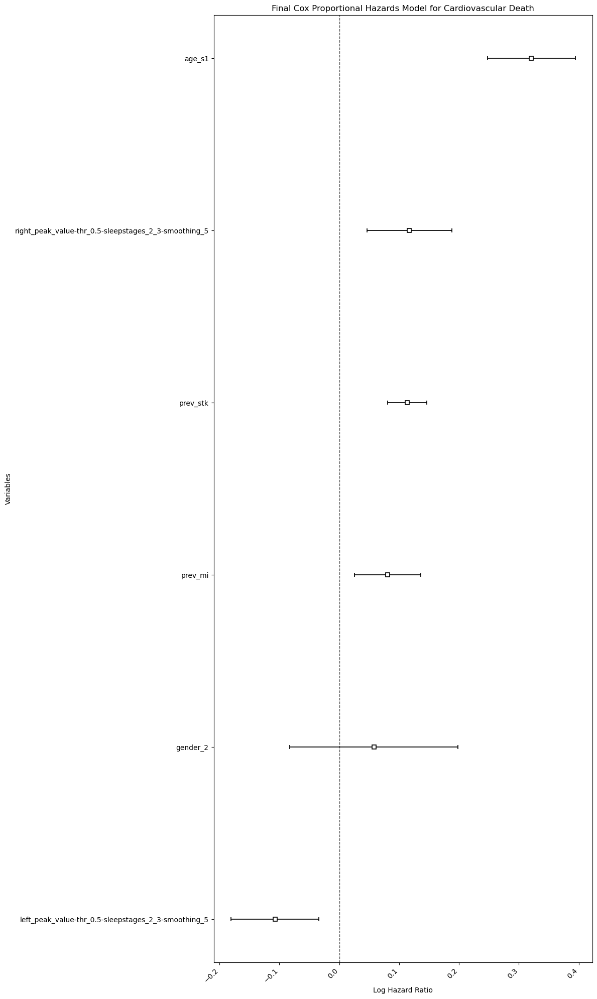

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
age_s1,0.320776,1.378197,0.037412,0.247450,0.394102,1.280756,1.483052,0.0,8.574209,9.976975e-18,56.476103
gender_2,0.057768,1.059469,0.071729,-0.082819,0.198354,0.920518,1.219394,0.0,0.805357,4.206135e-01,1.249433
left_peak_value-thr_0.5-sleepstages_2_3-smoothing_5,-0.107338,0.898222,0.037522,-0.180881,-0.033796,0.834535,0.966769,0.0,-2.860649,4.227749e-03,7.885895
prev_mi,0.080937,1.084303,0.028116,0.025830,0.136045,1.026167,1.145733,0.0,2.878652,3.993791e-03,7.968025
prev_stk,0.113309,1.119978,0.016745,0.080490,0.146128,1.083818,1.157344,0.0,6.766873,1.315958e-11,36.145095
right_peak_value-thr_0.5-sleepstages_2_3-smoothing_5,0.117111,1.124244,0.036073,0.046409,0.187813,1.047503,1.206607,0.0,3.246485,1.168394e-03,9.741257


In [36]:
# Define the parameters
sleep_stages_columns = [2, 3]
threshold = 0.5

# Convert sleep_stages_columns to a string joined by underscores
sleep_stages_str = "_".join(map(str, sleep_stages_columns))

fixed_cols = [
    'age',
    'gender_2',
    'prev_stk',
    'prev_mi',
    f'right_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5',
    f'left_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5',
]

event_duration_col = "stk_date"

output_dir = os.path.join(kox_model_refinement_dir, '0_full_control', f'{event_duration_col}')

run_cox(events_df, population_df_not_norm, output_dir, event_duration_col, fixed_cols, sleep_stages_columns, threshold, plot=True)

### Feature exploration
- Variance of right_peak_value-thr_"threshold"-sleepstages_3-smoothing_5 given threshold!

Removing age category data
Final dataset shape:  (5009, 39)
Removing age category data
Final dataset shape:  (4872, 39)
Removing age category data
Final dataset shape:  (4845, 39)
Removing age category data
Final dataset shape:  (4800, 39)


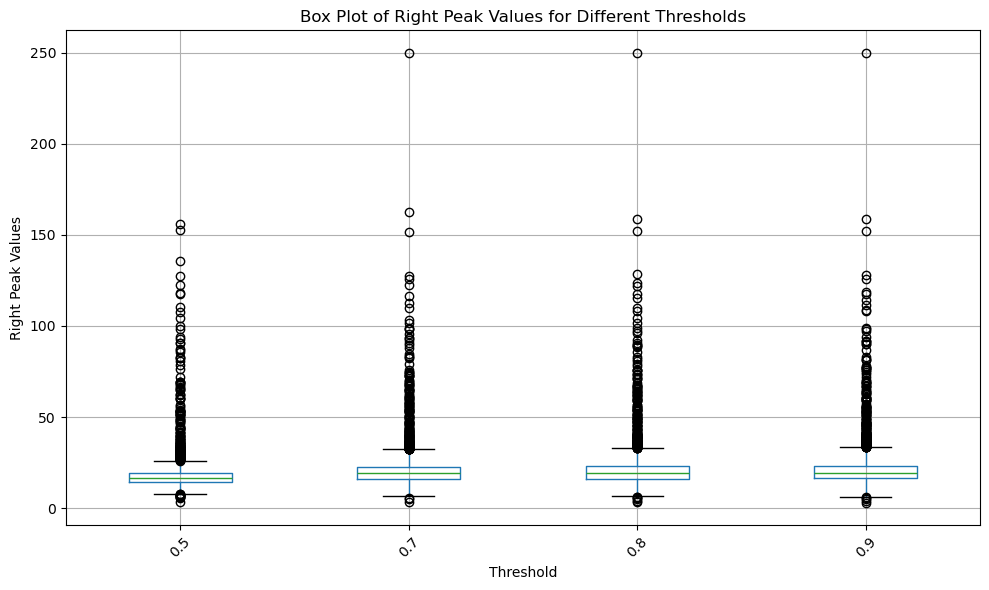

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters
sleep_stages_columns = [2, 3]
thresholds = [0.5, 0.7, 0.8, 0.9]
event_duration_col = "stk_date"
right_peak_values = {}

event_event_col = time_event_dict[event_duration_col]

# Iterate over thresholds and collect right_peak_values
for threshold in thresholds:
    population_df_norm = normalize_population_df(population_df_not_norm, skip_standardization=True)
    preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm, event_duration_col, event_event_col, sleep_stages_columns, threshold)
    col_name = f'right_peak_value-thr_{threshold}-sleepstages_2_3-smoothing_5'
    if col_name in preprocessed_cox_data.columns:
        right_peak_values[threshold] = np.clip(preprocessed_cox_data[col_name].values, None, 250)
    else:
        print(f"Column {col_name} not found in preprocessed data for threshold {threshold}")

# Find the maximum length of the arrays
max_length = max(len(vals) for vals in right_peak_values.values())

# Pad shorter arrays with NaN
for thresh in right_peak_values:
    right_peak_values[thresh] = np.pad(right_peak_values[thresh], (0, max_length - len(right_peak_values[thresh])), 'constant', constant_values=np.nan)
    
# Create a DataFrame for plotting
plot_data = pd.DataFrame({str(thresh): vals for thresh, vals in right_peak_values.items()})

# Plot the box plot
plt.figure(figsize=(10, 6))
plot_data.boxplot()
plt.xlabel('Threshold')
plt.ylabel('Right Peak Values')
plt.title('Box Plot of Right Peak Values for Different Thresholds')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Fix model, change gender

Final dataset shape:  (5009, 42)
Gender:  0  datapoints:  (2333, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:16<00:01,  1.79it/s]

Stopping refinement at iteration 030. No removable features left.


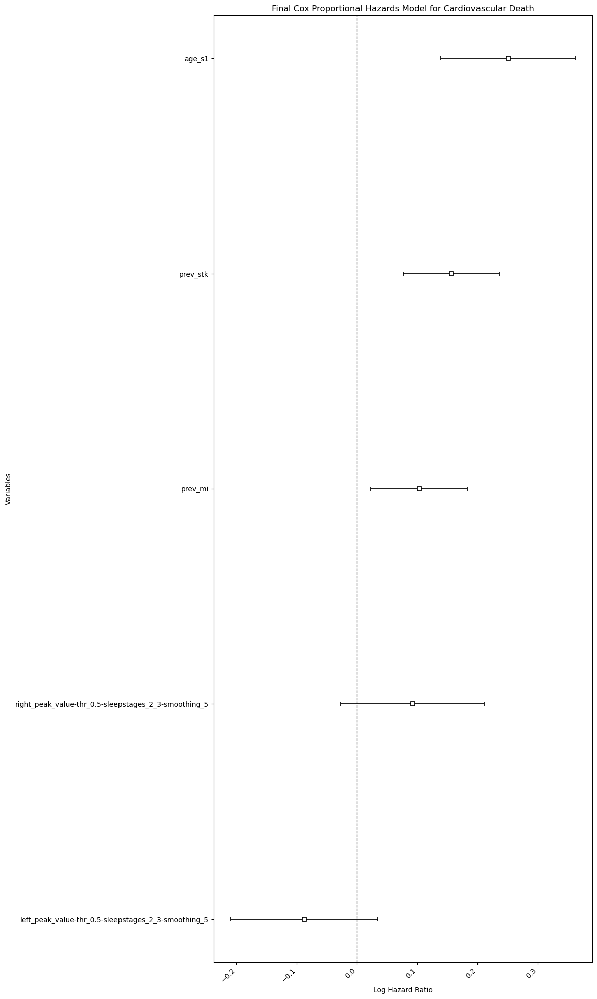

Gender:  1  datapoints:  (2676, 42)
Saved hyperparameters


 90%|█████████ | 28/31 [00:18<00:01,  1.55it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


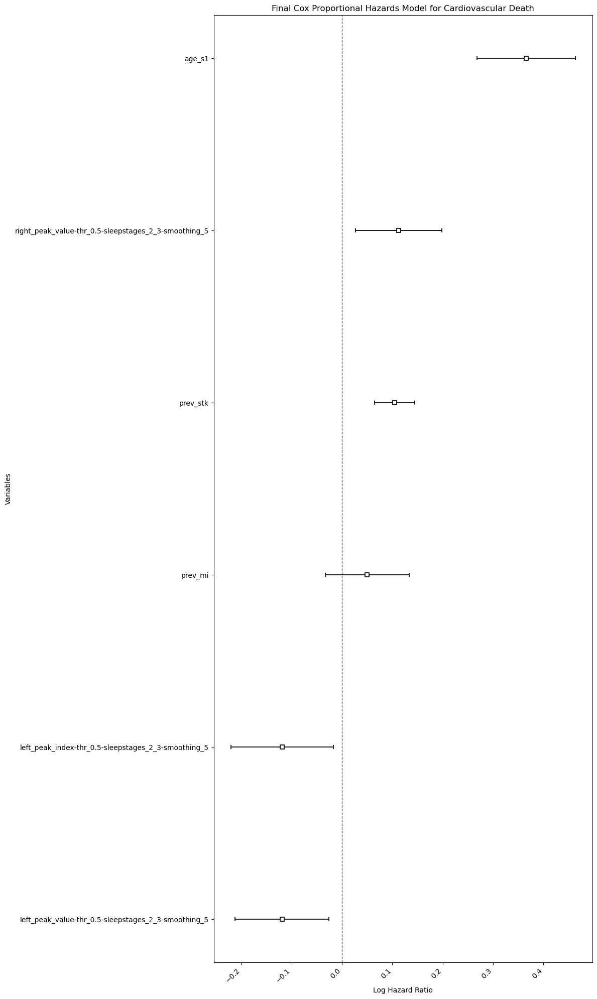

,gender,p-values
0,0,covariate age_s1 ...
1,1,covariate age_s1 ...


In [38]:
# Define the function to iterate over age and gender and collect p-values
def iterate_over_gender(preprocessed_data, duration_col, event_col, fixed_cols, output_dir):
    # Extract age categories and gender columns
    age_columns = [col for col in preprocessed_data.columns if col.startswith('age_category_s1_')]
    gender_column = "gender_2"
    # Initialize an empty list to store p-values
    p_values = []
    
    for gender in [0, 1]:
        # Filter the data for the current age category and gender
        filtered_data = preprocessed_data[preprocessed_data[gender_column] == gender]
        print("Gender: ", gender, " datapoints: ", filtered_data.shape)
        if gender == 0:
            output_dir_gender = os.path.join(output_dir, "male")
        else:
            output_dir_gender = os.path.join(output_dir, "female")

        if not filtered_data.empty:
            filtered_data = filtered_data.drop(age_columns, axis=1)
            filtered_data = filtered_data.drop([gender_column], axis=1)

            # Run Cox regression
            cox_fitted_model = refine_cox_model(filtered_data, event_duration_col, event_event_col, fixed_cols, output_dir_gender, plot=True)
            p_vals = cox_fitted_model['p']
            # Append the p-values with the corresponding age and gender
            p_values.append((gender, p_vals))
        else:
            print(f"No data for {age_col} and gender {gender}")
    
    return p_values
# Define the parameters
sleep_stages_columns = [2, 3]
threshold = 0.5

# Convert sleep_stages_columns to a string joined by underscores
sleep_stages_str = "_".join(map(str, sleep_stages_columns))

fixed_cols = [
    'age_s1',
    'prev_stk',
    'prev_mi',
    f'right_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5',
    f'left_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5'
]


event_duration_col = "stk_date"
event_event_col = time_event_dict[event_duration_col]

output_dir = os.path.join(kox_model_refinement_dir, '1_iterate_gender', f'{event_duration_col}')

population_df_norm = normalize_population_df(population_df_not_norm)
preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm,event_duration_col, event_event_col, sleep_stages_columns, threshold, remove_age_encodings = False)
# Iterate over age and gender and collect p-values
p_values = iterate_over_gender(preprocessed_cox_data, event_duration_col, event_event_col, fixed_cols, output_dir)

# Convert the p-values list to a DataFrame for easier analysis
p_values_df = pd.DataFrame(p_values, columns=['gender', 'p-values'])

# Display the DataFrame
p_values_df.head()

##### Findings
- **Gender 0 (Male)**: Left and right peak not really significant. 
- **Gender 1 (Female)**: Left and right peak are significant. 

- Age and prev_stk for both a factor

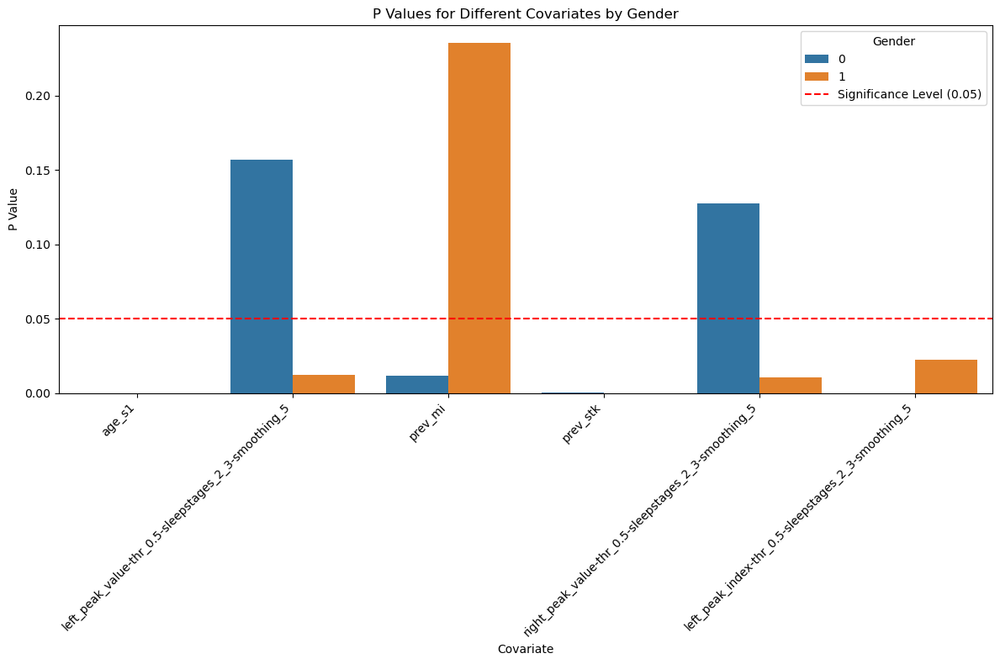

In [29]:
p_values_list = []
for row in p_values_df.itertuples(index=False):
    gender, p_vals_series = row
    p_vals_dict = p_vals_series.to_dict()
    p_vals_dict.update({'Gender': gender})
    p_values_list.append(p_vals_dict)

# Create a DataFrame from the list of dictionaries
p_values_structured_df = pd.DataFrame(p_values_list)

# Melt the DataFrame to long format for plotting
p_values_long_df = p_values_structured_df.melt(id_vars=['Gender'], var_name='Covariate', value_name='P Value')

# Plot the data using a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='Covariate', y='P Value', hue='Gender', data=p_values_long_df, ci=None)

plt.xlabel('Covariate')
plt.ylabel('P Value')
plt.title('P Values for Different Covariates by Gender')
plt.xticks(rotation=45, ha='right')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Level (0.05)')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

### Fix model, change age

Final dataset shape:  (5009, 42)
Age:  age_category_s1_10  datapoints:  (101, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:10<00:00,  2.70it/s]

Stopping refinement at iteration 030. No removable features left.


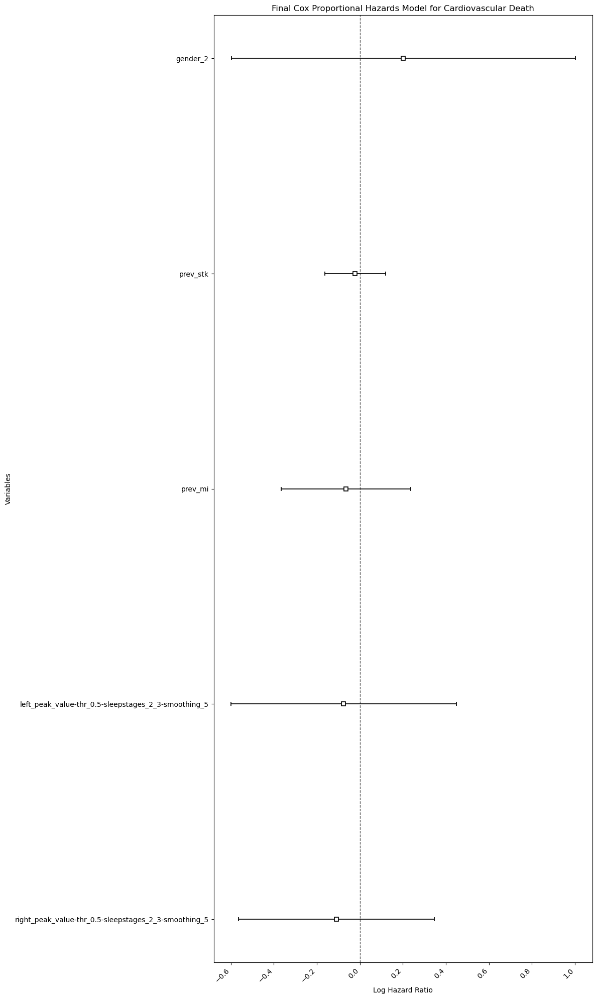

Age:  age_category_s1_6  datapoints:  (804, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:11<00:00,  2.55it/s]

Stopping refinement at iteration 030. No removable features left.


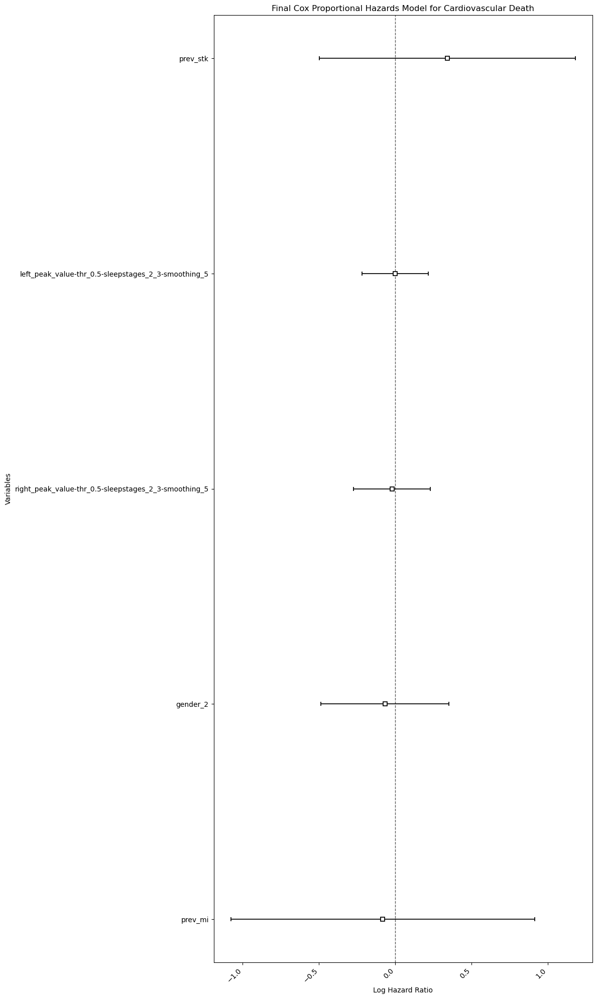

Age:  age_category_s1_7  datapoints:  (1519, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:13<00:00,  2.22it/s]

Stopping refinement at iteration 030. No removable features left.


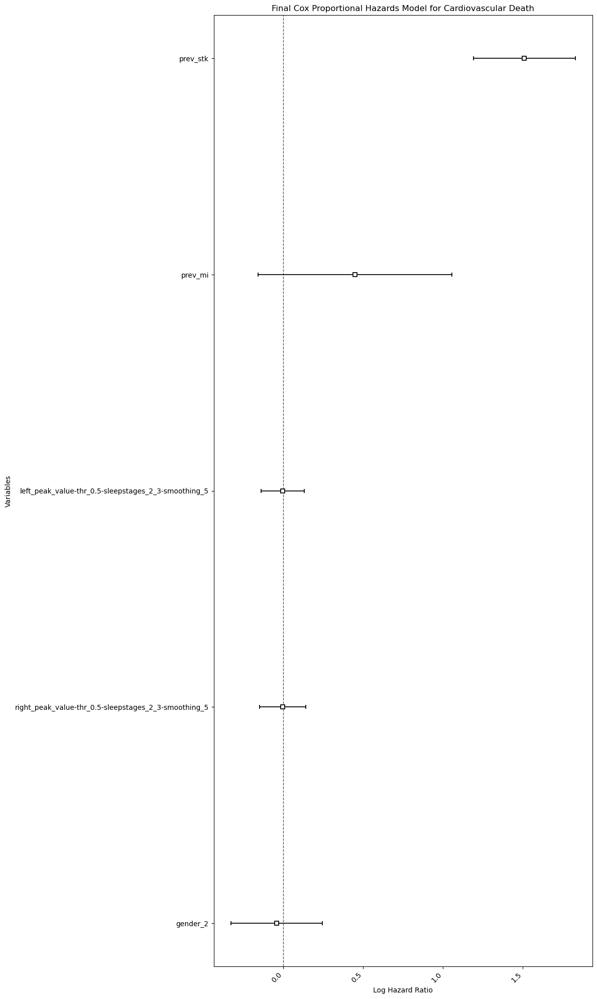

Age:  age_category_s1_8  datapoints:  (1430, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [04:13<00:17,  8.74s/it]

Stopping refinement at iteration 030. No removable features left.


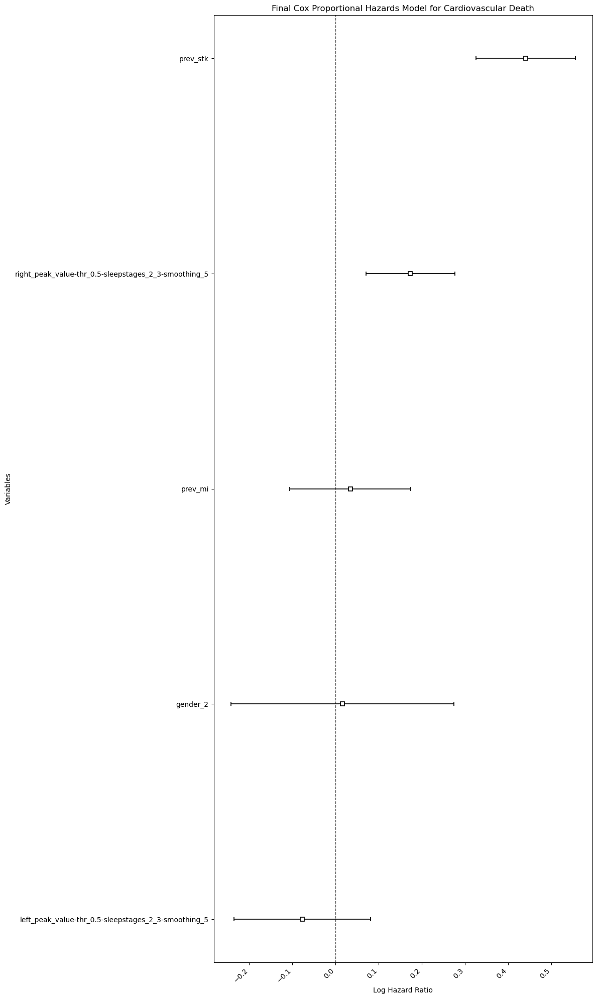

Age:  age_category_s1_9  datapoints:  (909, 42)
Saved hyperparameters


 87%|████████▋ | 27/31 [00:12<00:01,  2.18it/s]

Stopping refinement at iteration 028. All removable features have p-values below the threshold of 0.05.


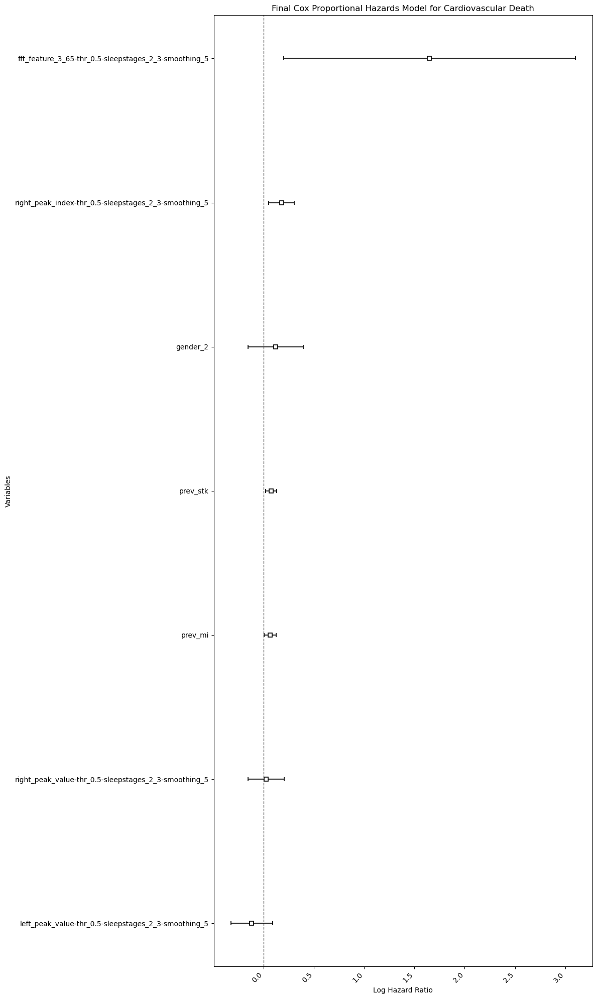

,age,p-values
0,age_category_s1_10,covariate gender_2 ...
1,age_category_s1_6,covariate gender_2 ...
2,age_category_s1_7,covariate gender_2 ...
3,age_category_s1_8,covariate gender_2 ...
4,age_category_s1_9,covariate fft_feature_3_65-thr_0.5-sleepstages...


In [39]:
# Define the function to iterate over age and gender and collect p-values
def iterate_over_age(preprocessed_data, duration_col, event_col, fixed_cols, output_dir):
    # Extract age categories and gender columns
    age_columns = [col for col in preprocessed_data.columns if col.startswith('age_category_s1_')]
    
    # Initialize an empty list to store p-values
    p_values = []
    
    for age_col in age_columns:
        # Filter the data for the current age category and gender
        filtered_data = preprocessed_data[preprocessed_data[age_col] == 1]
        print("Age: ", age_col, " datapoints: ", filtered_data.shape)
        
        output_dir_age = os.path.join(output_dir, age_col)
        
        if not filtered_data.empty:
            filtered_data = filtered_data.drop(age_columns, axis=1)
            filtered_data = filtered_data.drop(['age_s1'], axis=1)

            # Run Cox regression
            cox_fitted_model = refine_cox_model(filtered_data, event_duration_col, event_event_col, fixed_cols, output_dir_age, plot=True)
            p_vals = cox_fitted_model['p']
            # Append the p-values with the corresponding age and gender
            p_values.append((age_col, p_vals))
        else:
            print(f"No data for {age_col}")
    
    return p_values

# Define the parameters
sleep_stages_columns = [2, 3]
threshold = 0.5

# Convert sleep_stages_columns to a string joined by underscores
sleep_stages_str = "_".join(map(str, sleep_stages_columns))

fixed_cols = [
    'gender_2',
    'prev_stk',
    'prev_mi',
    f'right_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5',
    f'left_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5'
]

event_duration_col = "stk_date"
event_event_col = time_event_dict[event_duration_col]

output_dir = os.path.join(kox_model_refinement_dir, '2_iterate_age', f'{event_duration_col}')

population_df_norm = normalize_population_df(population_df_not_norm)
preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm,event_duration_col, event_event_col, sleep_stages_columns, threshold, remove_age_encodings = False)
# Iterate over age and gender and collect p-values
p_values = iterate_over_age(preprocessed_cox_data, event_duration_col, event_event_col, fixed_cols, output_dir)

# Convert the p-values list to a DataFrame for easier analysis
p_values_df = pd.DataFrame(p_values, columns=['age', 'p-values'])

# Display the DataFrame
p_values_df.head()

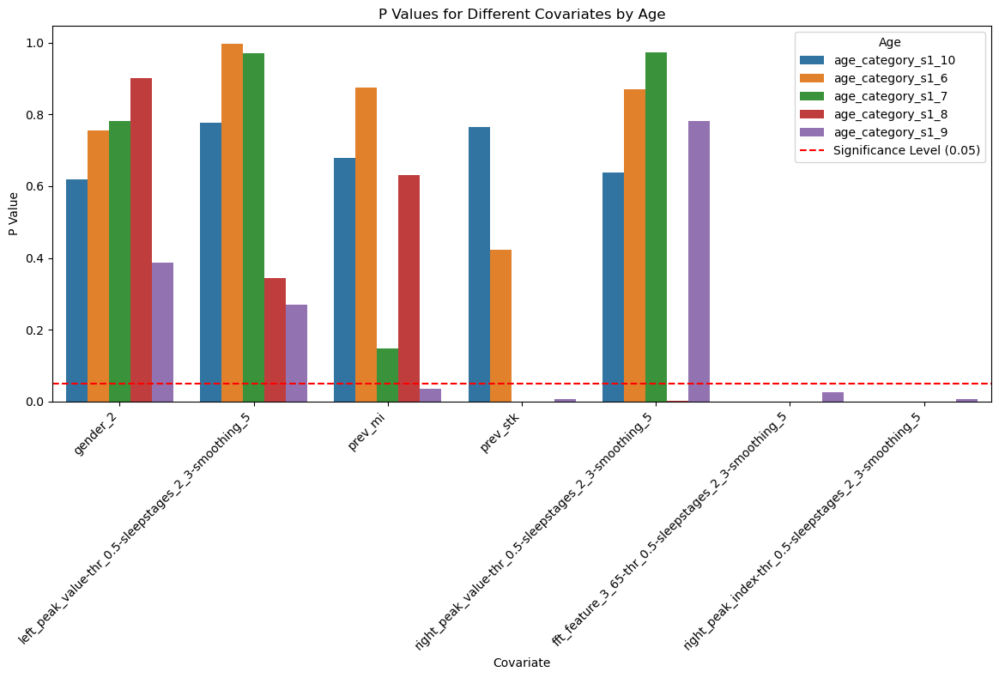

In [41]:
p_values_list = []
for row in p_values_df.itertuples(index=False):
    age, p_vals_series = row
    p_vals_dict = p_vals_series.to_dict()
    p_vals_dict.update({'Age': age})
    p_values_list.append(p_vals_dict)

# Create a DataFrame from the list of dictionaries
p_values_structured_df = pd.DataFrame(p_values_list)

# Melt the DataFrame to long format for plotting
p_values_long_df = p_values_structured_df.melt(id_vars=['Age'], var_name='Covariate', value_name='P Value')

# Plot the data using a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='Covariate', y='P Value', hue='Age', data=p_values_long_df, ci=None)

plt.xlabel('Covariate')
plt.ylabel('P Value')
plt.title('P Values for Different Covariates by Age')
plt.xticks(rotation=45, ha='right')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Level (0.05)')
plt.legend(title='Age')
plt.tight_layout()
plt.show()

Final dataset shape:  (5009, 42)
Age:  age_category_s1_10 Gender:  0  datapoints:  (44, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:10<00:00,  2.85it/s]

Stopping refinement at iteration 030. No removable features left.


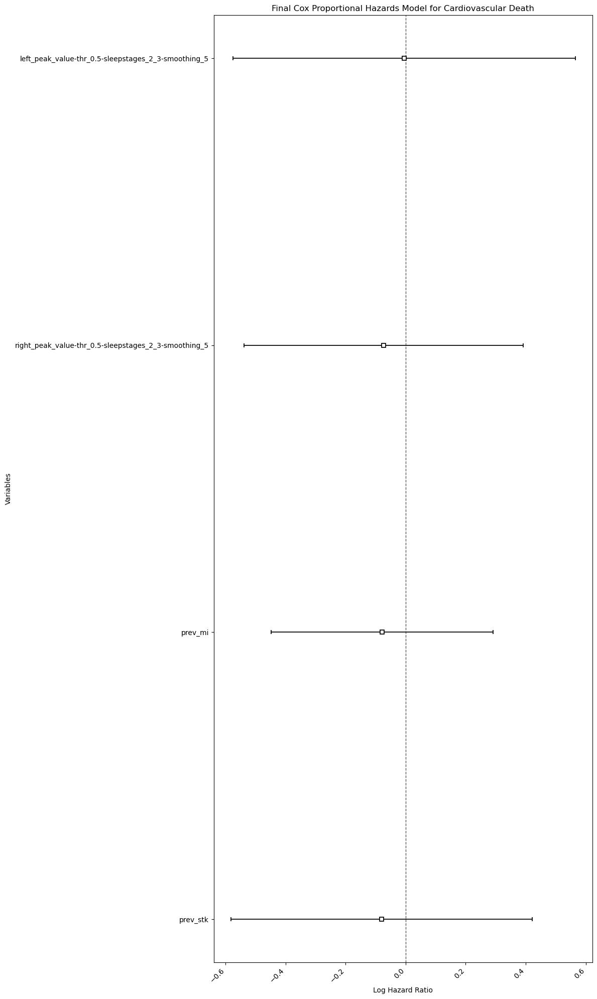

Age:  age_category_s1_10 Gender:  1  datapoints:  (57, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:10<00:00,  2.73it/s]

Stopping refinement at iteration 030. No removable features left.


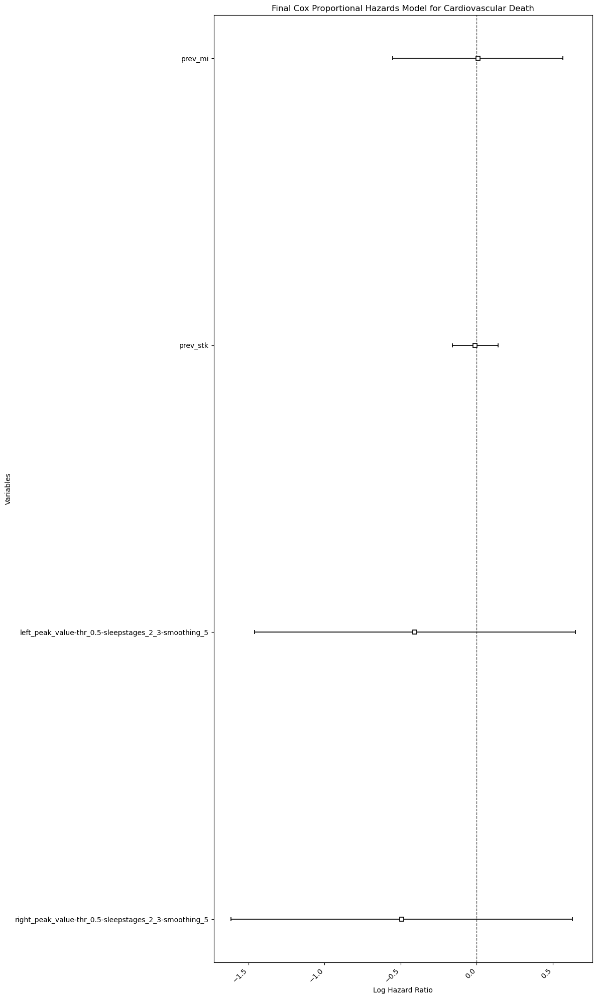

Age:  age_category_s1_6 Gender:  0  datapoints:  (355, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:10<00:00,  2.68it/s]

Stopping refinement at iteration 030. No removable features left.


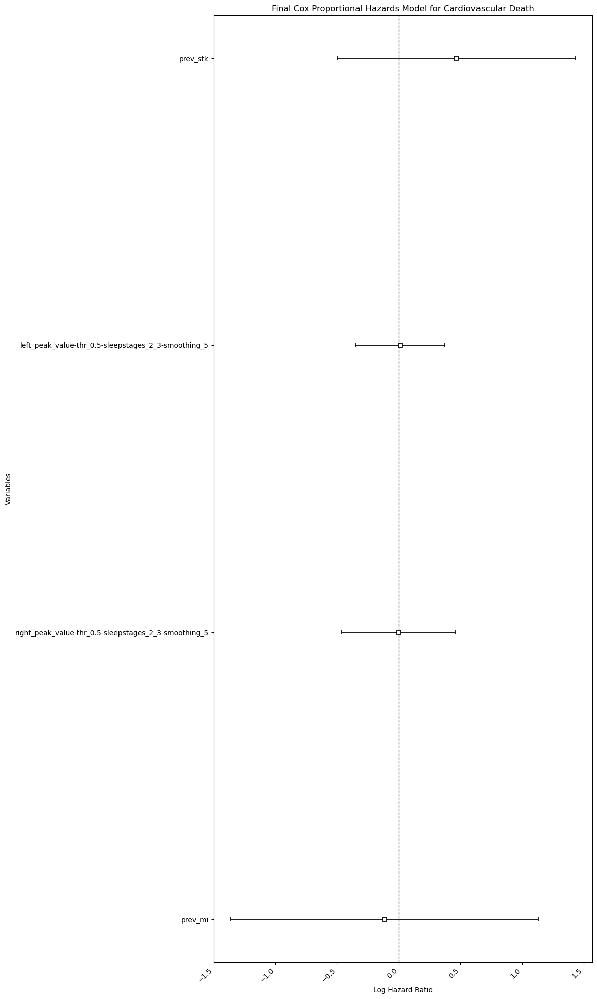

Age:  age_category_s1_6 Gender:  1  datapoints:  (449, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:10<00:00,  2.73it/s]

Stopping refinement at iteration 030. No removable features left.


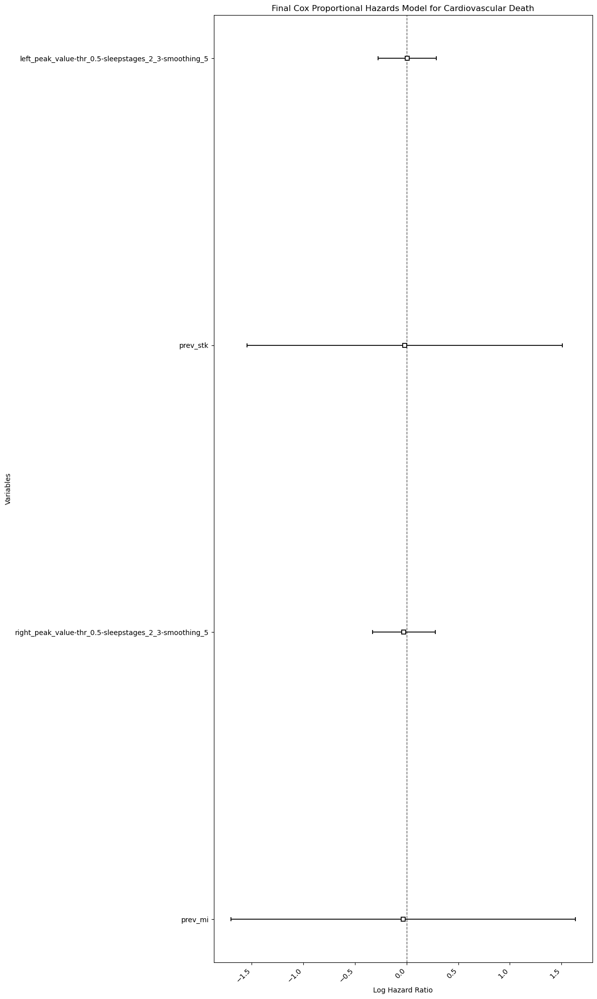

Age:  age_category_s1_7 Gender:  0  datapoints:  (719, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:11<00:00,  2.44it/s]

Stopping refinement at iteration 030. No removable features left.


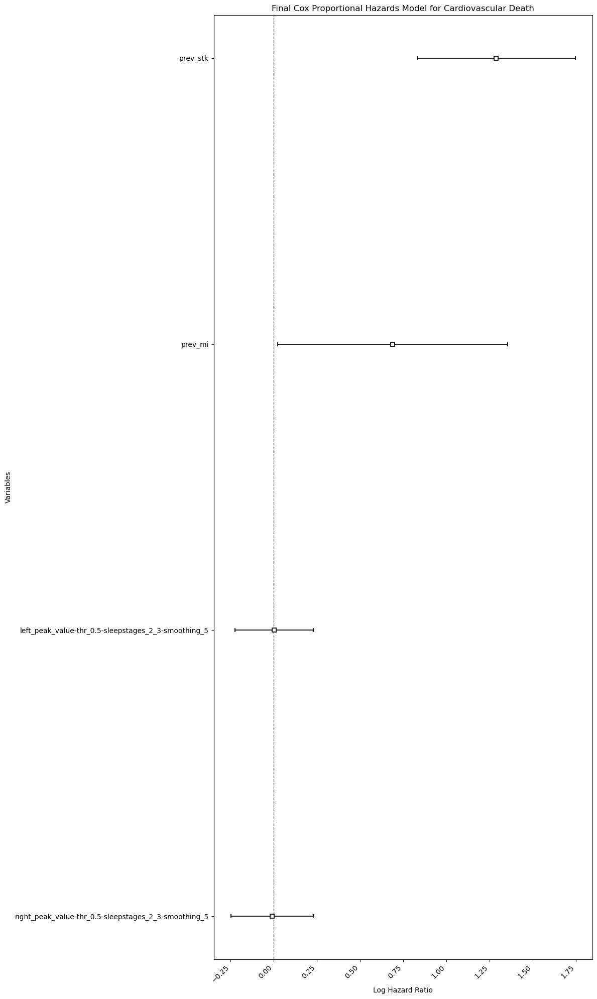

Age:  age_category_s1_7 Gender:  1  datapoints:  (800, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:12<00:00,  2.41it/s]

Stopping refinement at iteration 030. No removable features left.


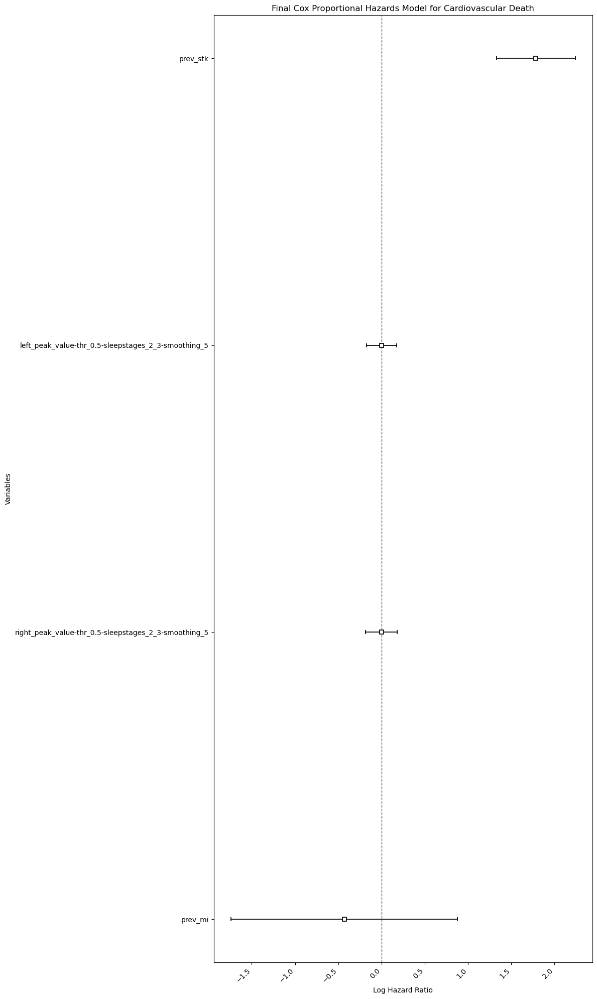

Age:  age_category_s1_8 Gender:  0  datapoints:  (706, 42)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:11<00:00,  2.51it/s]

Stopping refinement at iteration 030. No removable features left.


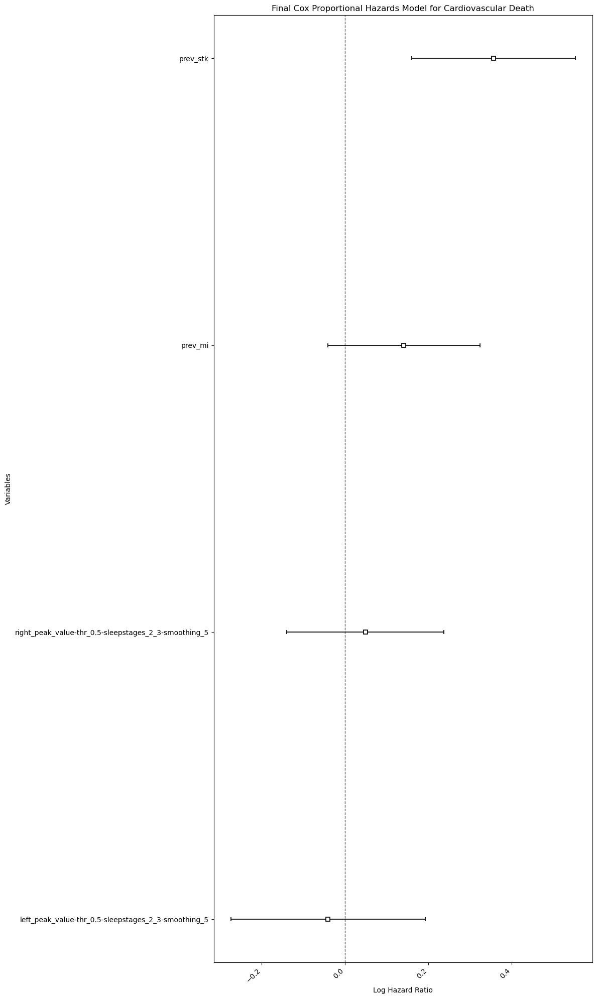

Age:  age_category_s1_8 Gender:  1  datapoints:  (724, 42)
Saved hyperparameters


 90%|█████████ | 28/31 [01:54<00:12,  4.08s/it]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


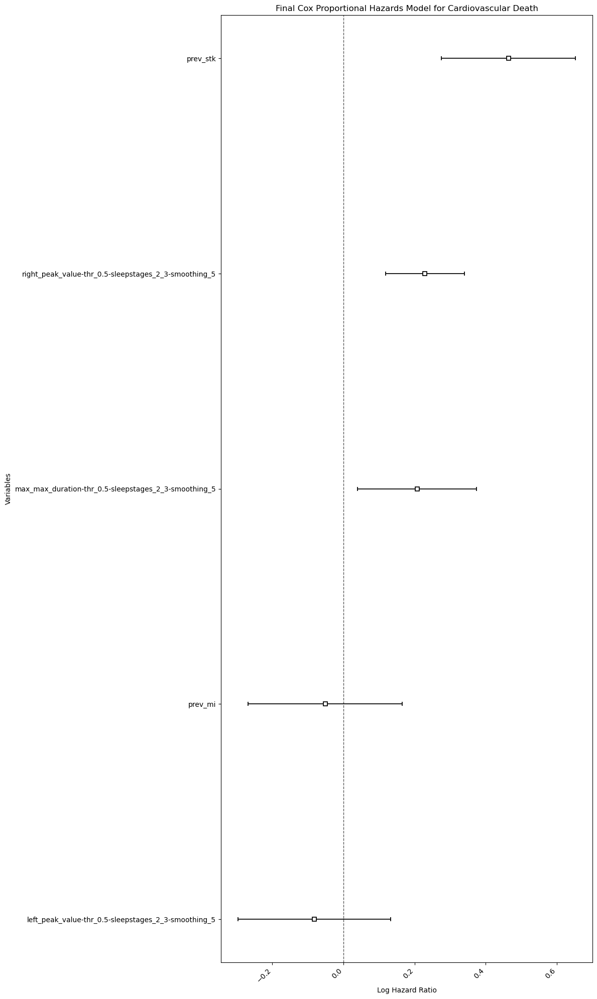

Age:  age_category_s1_9 Gender:  0  datapoints:  (398, 42)
Saved hyperparameters


 90%|█████████ | 28/31 [00:10<00:01,  2.55it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


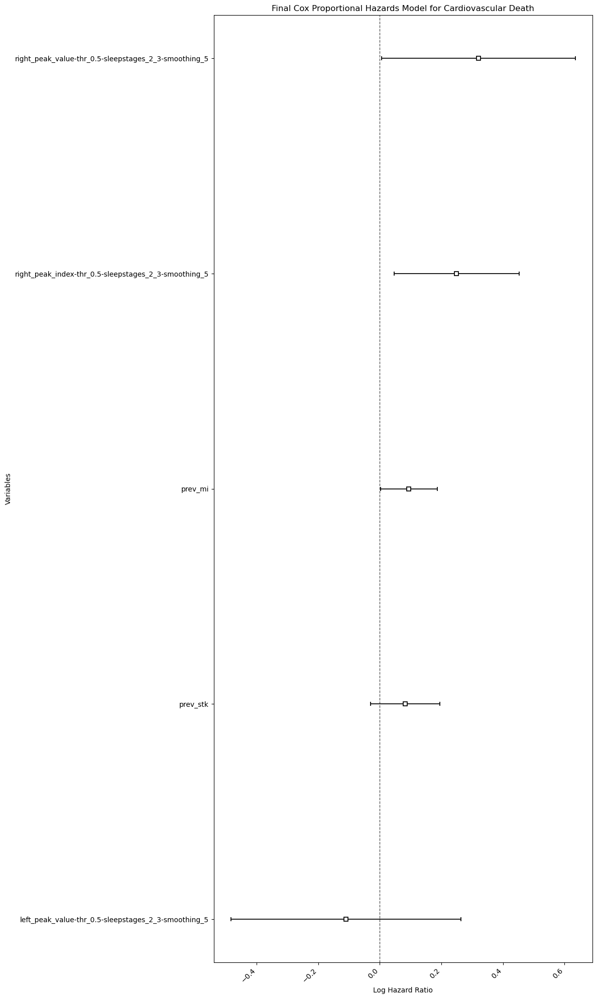

Age:  age_category_s1_9 Gender:  1  datapoints:  (511, 42)
Saved hyperparameters


 90%|█████████ | 28/31 [00:11<00:01,  2.41it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


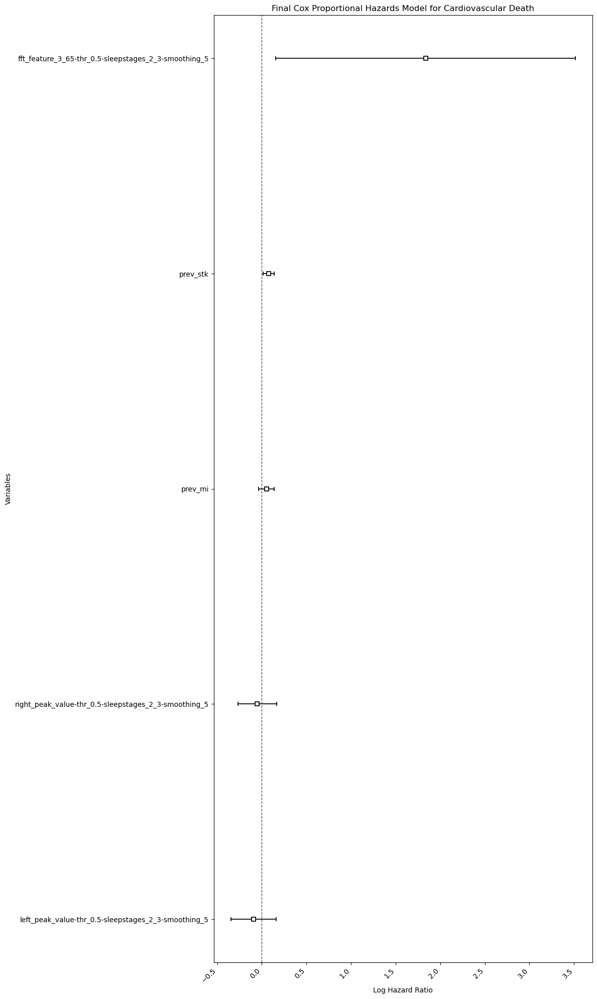

In [42]:
def iterate_over_age_and_gender(preprocessed_data, duration_col, event_col, fixed_cols, output_dir):
    # Extract age categories and gender columns
    age_columns = [col for col in preprocessed_data.columns if col.startswith('age_category_s1_')]
    gender_column = "gender_2"
    
    # Initialize an empty list to store p-values
    p_values = []
    
    for age_col in age_columns:
        for gender in [0, 1]:
            if gender == 0:
                output_dir_age_gender = os.path.join(output_dir, f'male-{age}')
            else:
                output_dir_age_gender = os.path.join(output_dir, f'female-{age}')
            
            # Filter the data for the current age category and gender
            filtered_data = preprocessed_data[(preprocessed_data[age_col] == 1) & (preprocessed_data[gender_column] == gender)]
            print("Age: ", age_col, "Gender: ", gender, " datapoints: ", filtered_data.shape)
            if not filtered_data.empty:
                filtered_data = filtered_data.drop(age_columns, axis=1)
                filtered_data = filtered_data.drop(['age_s1'], axis=1)
                filtered_data = filtered_data.drop([gender_column], axis=1)

                # Run Cox regression
                cox_fitted_model = refine_cox_model(filtered_data, event_duration_col, event_event_col, fixed_cols, output_dir_age_gender, plot=True)
                p_vals = cox_fitted_model['p']
                # Append the p-values with the corresponding age and gender
                p_values.append((age_col, gender, p_vals))
            else:
                print(f"No data for {age_col} and gender {gender}")
    
    return p_values

# Define the parameters
sleep_stages_columns = [2, 3]
threshold = 0.5

# Convert sleep_stages_columns to a string joined by underscores
sleep_stages_str = "_".join(map(str, sleep_stages_columns))

fixed_cols = [
    'prev_stk',
    'prev_mi',
    f'right_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5',
    f'left_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5'
]

event_duration_col = "stk_date"
event_event_col = time_event_dict[event_duration_col]

output_dir = os.path.join(kox_model_refinement_dir, '3_iterate_gender_age', f'{event_duration_col}')

population_df_norm = normalize_population_df(population_df_not_norm)
preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm,event_duration_col, event_event_col, sleep_stages_columns, threshold, remove_age_encodings = False)
# Iterate over age and gender and collect p-values
p_values = iterate_over_age_and_gender(preprocessed_cox_data, event_duration_col, event_event_col, fixed_cols, output_dir)

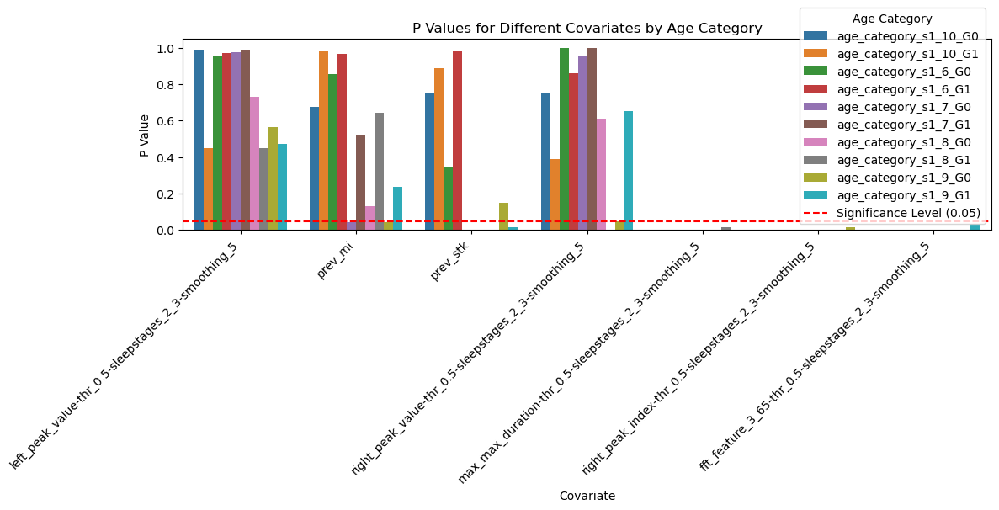

In [63]:
# Convert the p-values list to a DataFrame for easier analysis
p_values_list = []
for row in p_values:
    age_category, gender, p_vals_series = row
    p_vals_dict = p_vals_series.to_dict()
    p_vals_dict.update({'Age Category': age_category, 'Gender': gender})
    p_values_list.append(p_vals_dict)

p_values_df = pd.DataFrame(p_values_list)

p_values_df['Age_Gender'] = p_values_df['Age Category'] + '_G' + p_values_df['Gender'].astype(str)
p_values_df = p_values_df.drop(['Age Category', 'Gender'], axis=1)

p_values_df = p_values_df.melt(id_vars=['Age_Gender'], var_name='Covariate', value_name='P Value')

# Plotting using sns.boxplot
plt.figure(figsize=(12, 6))
sns.barplot(x='Covariate', y='P Value', hue='Age_Gender', data=p_values_df, ci=None)
plt.xlabel('Covariate')
plt.ylabel('P Value')
plt.title('P Values for Different Covariates by Age Category')
plt.xticks(rotation=45, ha='right')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Level (0.05)')
plt.legend(title='Age Category')
plt.tight_layout()
plt.show()

### Different Thresholds

- left peak is an indicator at all thresholds. Right peak isnt

Removing age category data
Final dataset shape:  (5009, 37)
Saved hyperparameters


 94%|█████████▎| 29/31 [00:24<00:01,  1.19it/s]

Stopping refinement at iteration 030. No removable features left.


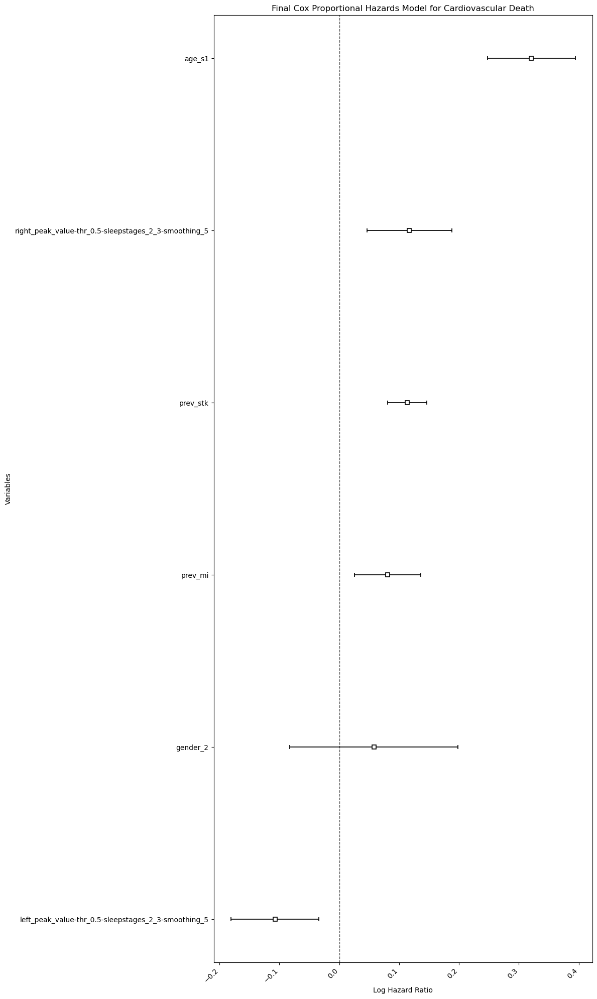

Removing age category data
Final dataset shape:  (4872, 37)
Saved hyperparameters


 90%|█████████ | 28/31 [00:21<00:02,  1.27it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


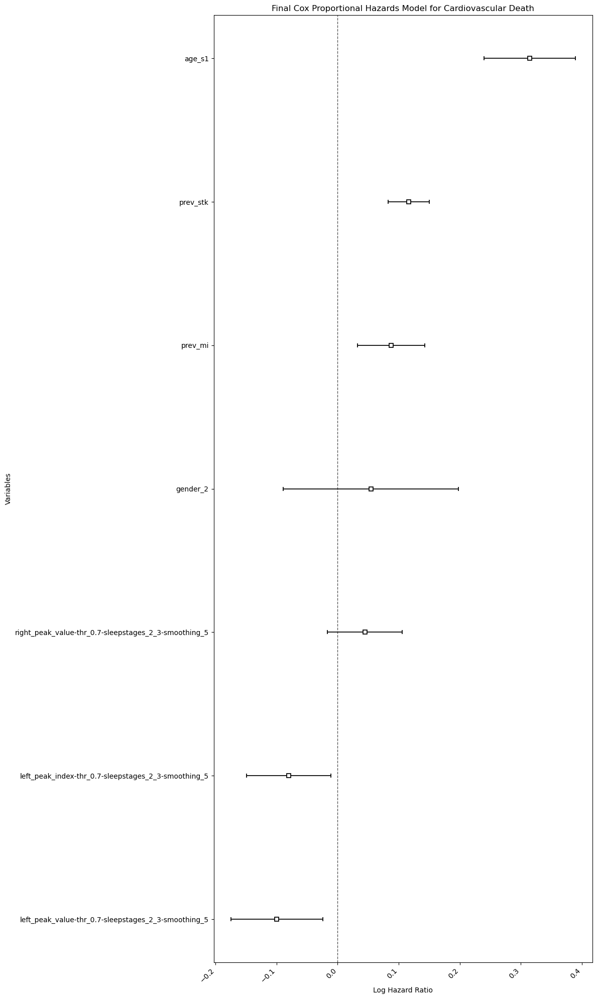

Removing age category data
Final dataset shape:  (4845, 37)
Saved hyperparameters


 90%|█████████ | 28/31 [00:21<00:02,  1.29it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


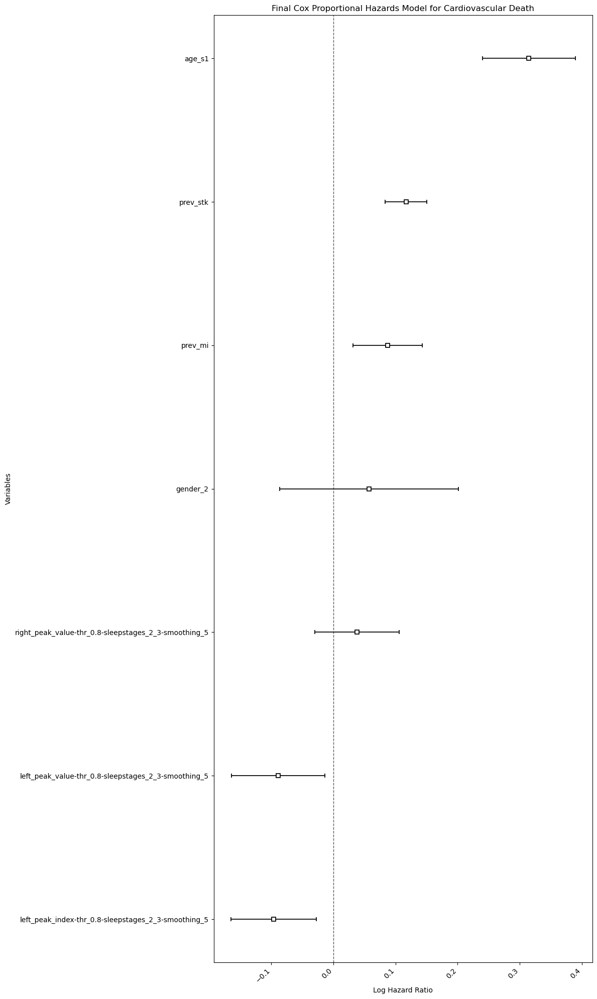

Removing age category data
Final dataset shape:  (4800, 37)
Saved hyperparameters


 90%|█████████ | 28/31 [00:22<00:02,  1.24it/s]

Stopping refinement at iteration 029. All removable features have p-values below the threshold of 0.05.


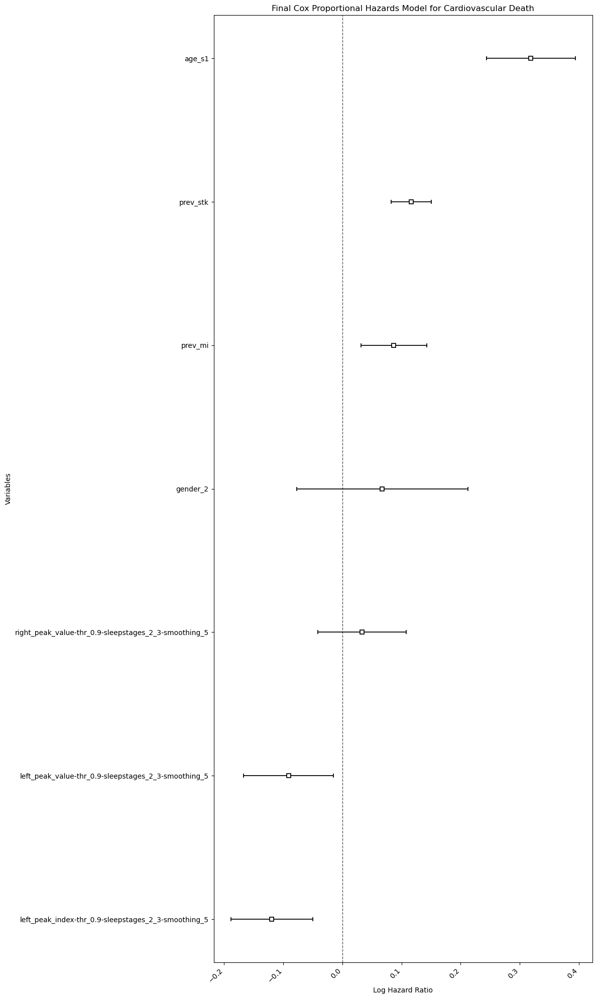

,threshold,p-values
0,0.5,covariate age_s1 ...
1,0.7,covariate age_s1 ...
2,0.8,covariate age_s1 ...
3,0.9,covariate age_s1 ...


In [65]:
# Define the function to iterate over age and gender and collect p-values
def iterate_over_threshold(events_df, population_df_norm, event_duration_col, sleep_stages_columns, output_dir):
    event_event_col = time_event_dict[event_duration_col]
    
    thresholds = [0.5, 0.7, 0.8, 0.9]
    p_values = []
    
    # Convert sleep_stages_columns to a string joined by underscores
    sleep_stages_str = "_".join(map(str, sleep_stages_columns))
    
    for thr in thresholds:
        output_dir_thr = os.path.join(output_dir, str(thr))
        fixed_cols = [
            'gender_2',
            'age_s1',
            'prev_stk',
            'prev_mi',
            f'right_peak_value-thr_{thr}-sleepstages_{sleep_stages_str}-smoothing_5',
            f'left_peak_value-thr_{threshold}-sleepstages_{sleep_stages_str}-smoothing_5'
        ]
            
        preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm, event_duration_col, event_event_col, sleep_stages_columns, thr)
        # Run Cox regression
        cox_fitted_model = refine_cox_model(preprocessed_cox_data, event_duration_col, event_event_col, fixed_cols, output_dir_thr, plot=True)
        p_vals = cox_fitted_model['p']
        # Append the p-values with the corresponding age and gender
        p_values.append((thr, p_vals))
    
    return p_values

# Define the parameters
sleep_stages_columns = [2, 3]

population_df_norm = normalize_population_df(population_df_not_norm)
event_duration_col = "stk_date"

output_dir = os.path.join(kox_model_refinement_dir, '4_iterate_threshold', f'{event_duration_col}')

p_values = iterate_over_threshold(events_df, population_df_norm, event_duration_col, sleep_stages_columns, output_dir)

p_values_df = pd.DataFrame(p_values, columns=['threshold', 'p-values'])

# Display the DataFrame
p_values_df.head()

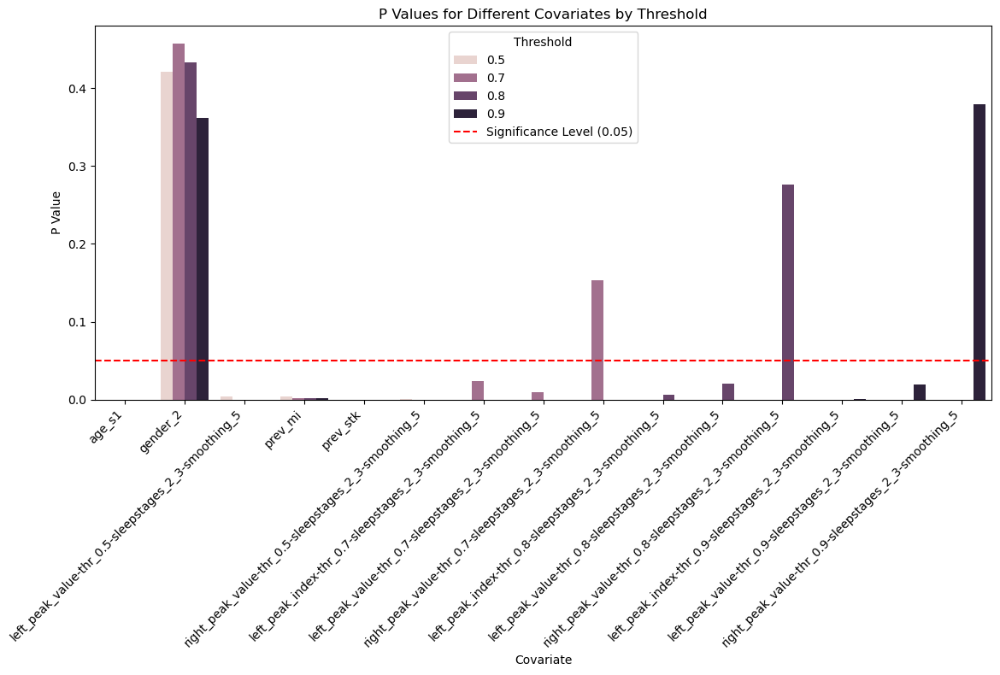

In [66]:
p_values_list = []
for row in p_values_df.itertuples(index=False):
    threshold, p_vals_series = row
    p_vals_dict = p_vals_series.to_dict()
    p_vals_dict.update({'Threshold': threshold})
    p_values_list.append(p_vals_dict)

# Create a DataFrame from the list of dictionaries
p_values_structured_df = pd.DataFrame(p_values_list)

# Melt the DataFrame to long format for plotting
p_values_long_df = p_values_structured_df.melt(id_vars=['Threshold'], var_name='Covariate', value_name='P Value')

# Plot the data using a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='Covariate', y='P Value', hue='Threshold', data=p_values_long_df, ci=None)

plt.xlabel('Covariate')
plt.ylabel('P Value')
plt.title('P Values for Different Covariates by Threshold')
plt.xticks(rotation=45, ha='right')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Level (0.05)')
plt.legend(title='Threshold')
plt.tight_layout()
plt.show()

### Download data

In [ ]:
!zip -r /home/ec2-user/SageMaker/datasets/nsrr/shhs/kox-model-refinement.zip /home/ec2-user/SageMaker/datasets/nsrr/shhs/kox-model-refinement

### Non Linear Models

In [68]:
!pip install scikit-survival --quiet

In [97]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

from sklearn import set_config
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

from sksurv.datasets import load_gbsg2
from sksurv.ensemble import RandomSurvivalForest

set_config(display="text")  # displays text representation of estimators

In [122]:
sleep_stages_columns = [2, 3]
threshold = 0.5

event_duration_col = "stk_date"
event_event_col = time_event_dict[event_duration_col]

population_df_norm = normalize_population_df(population_df_not_norm)
preprocessed_cox_data = run_cox_preprocessing(events_df, population_df_norm, event_duration_col,event_event_col, sleep_stages_columns, threshold)  

Removing age category data
Final dataset shape:  (5009, 37)


In [123]:
preprocessed_cox_data.head()

# Convert to structured array
y = np.array([(e, t) for e, t in zip(preprocessed_cox_data['stroke'], preprocessed_cox_data['stk_date'])], dtype=[('stroke', 'bool'), ('stk_date', 'f8')])
Xt = preprocessed_cox_data.drop(["stroke", "stk_date"], axis=1)

In [134]:
random_state = 20

X_train, X_test, y_train, y_test = train_test_split(Xt, y, test_size=0.25, random_state=random_state)

In [125]:
rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=random_state
)
rsf.fit(X_train, y_train)

RandomSurvivalForest(min_samples_leaf=15, min_samples_split=10,
                     n_estimators=1000, n_jobs=-1, random_state=20)

In [126]:
rsf.score(X_test, y_test)

0.8060729518110638

In [127]:
X_test.columns

Index(['age_s1', 'avg_kc_density-thr_0.5-sleepstages_2_3',
       'avg_std_kc-thr_0.5-sleepstages_2_3-smoothing_5', 'avgsat', 'bmi_s1',
       'fft_feature_05_2-thr_0.5-sleepstages_2_3-smoothing_5',
       'fft_feature_0_35-thr_0.5-sleepstages_2_3-smoothing_5',
       'fft_feature_1_45-thr_0.5-sleepstages_2_3-smoothing_5',
       'fft_feature_2_55-thr_0.5-sleepstages_2_3-smoothing_5',
       'fft_feature_3_65-thr_0.5-sleepstages_2_3-smoothing_5', 'gender_2',
       'global_min_max_value-thr_0.5-sleepstages_2_3-smoothing_5',
       'global_min_min_value-thr_0.5-sleepstages_2_3-smoothing_5',
       'global_min_std-thr_0.5-sleepstages_2_3-smoothing_5',
       'global_min_value-thr_0.5-sleepstages_2_3-smoothing_5',
       'left_peak_index-thr_0.5-sleepstages_2_3-smoothing_5',
       'left_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5',
       'left_peak_min_value-thr_0.5-sleepstages_2_3-smoothing_5',
       'left_peak_std-thr_0.5-sleepstages_2_3-smoothing_5',
       'left_peak_value-t

In [128]:
X_test_sorted = X_test.sort_values(by=["right_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5", "age_s1"])
X_test_sel = pd.concat((X_test_sorted.head(3), X_test_sorted.tail(3)))

X_test_sel

,age_s1,avg_kc_density-thr_0.5-sleepstages_2_3,avg_std_kc-thr_0.5-sleepstages_2_3-smoothing_5,avgsat,bmi_s1,fft_feature_05_2-thr_0.5-sleepstages_2_3-smoothing_5,fft_feature_0_35-thr_0.5-sleepstages_2_3-smoothing_5,fft_feature_1_45-thr_0.5-sleepstages_2_3-smoothing_5,fft_feature_2_55-thr_0.5-sleepstages_2_3-smoothing_5,fft_feature_3_65-thr_0.5-sleepstages_2_3-smoothing_5,gender_2,global_min_max_value-thr_0.5-sleepstages_2_3-smoothing_5,global_min_min_value-thr_0.5-sleepstages_2_3-smoothing_5,global_min_std-thr_0.5-sleepstages_2_3-smoothing_5,global_min_value-thr_0.5-sleepstages_2_3-smoothing_5,left_peak_index-thr_0.5-sleepstages_2_3-smoothing_5,left_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5,left_peak_min_value-thr_0.5-sleepstages_2_3-smoothing_5,left_peak_std-thr_0.5-sleepstages_2_3-smoothing_5,left_peak_value-thr_0.5-sleepstages_2_3-smoothing_5,max_kc_density-thr_0.5-sleepstages_2_3,max_max_duration-thr_0.5-sleepstages_2_3-smoothing_5,median_kc_density-thr_0.5-sleepstages_2_3,min_max_duration-thr_0.5-sleepstages_2_3-smoothing_5,minsat,prev_chf,prev_mi,prev_stk,right_peak_index-thr_0.5-sleepstages_2_3-smoothing_5,right_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5,right_peak_min_value-thr_0.5-sleepstages_2_3-smoothing_5,right_peak_std-thr_0.5-sleepstages_2_3-smoothing_5,right_peak_value-thr_0.5-sleepstages_2_3-smoothing_5,std_kc_density-thr_0.5-sleepstages_2_3,variance_duration-thr_0.5-sleepstages_2_3-smoothing_5
5352,0.165882,-1.841407,-1.360800,0.736209,-0.721663,-1.172262,-0.661910,-0.894805,0.032706,-0.050762,0.0,-0.964397,0.275750,-0.263089,1.770049,-0.364563,-0.160392,1.055847,-0.509481,-0.106243,-2.365514,-1.700376,-1.294269,-1.906991,0.066491,3.422545,0.910276,-0.103531,-1.874021,-0.234129,0.893797,-0.491921,0.237269,-2.422941,-0.231295
1012,-1.882162,-1.568585,-0.834500,0.223503,-0.885177,-0.100464,-0.070805,-0.520953,-0.203361,-0.068551,0.0,-0.772619,0.061763,-0.095452,0.673334,-0.212080,-0.180156,0.792685,-0.404483,-0.732493,-1.970648,1.172737,-1.294269,1.123236,0.225482,-0.136365,-0.158005,-0.103531,0.982547,-0.232028,0.985831,-0.509641,0.043222,-1.677165,-0.028739
950,-1.436935,-1.709885,-1.422791,1.325512,-1.666803,-0.871828,-0.548775,-0.657852,-0.146733,-0.049306,1.0,-0.965579,0.227490,-0.202663,1.382287,1.045908,-0.159476,0.854976,-0.532141,-0.465757,-1.970648,-0.934213,-1.294269,0.214167,1.179428,-0.136365,-0.158005,-0.103531,0.179137,-0.229781,1.074862,-0.635344,0.028910,-2.093106,-0.555383
1842,0.878245,-0.222055,0.469213,0.173185,3.137347,-0.028677,-0.081828,0.280425,0.097204,0.027326,1.0,5.467654,-0.036386,0.000773,-0.478333,0.588458,-0.040757,0.074430,0.068125,-0.201938,0.003681,-0.551131,-0.178457,-0.391878,0.066491,-0.136365,3.046836,-0.103531,-0.624273,0.377013,-0.264245,0.360619,0.260144,-0.307280,0.214327
2361,1.234427,-0.495457,3.899340,-1.552205,0.269090,2.453792,2.219937,0.561449,0.003697,0.084390,0.0,2.235168,-0.503043,0.663545,-2.848977,-4.252890,0.255776,-0.283576,0.220495,-0.596609,1.188278,2.178326,-0.178457,1.224243,-0.569473,-0.136365,-0.158005,1.894505,0.982547,0.389242,-2.175824,1.656365,3.689871,0.152807,1.368892
3765,0.700154,-0.042676,4.809372,0.165825,-0.264562,1.219275,1.138630,0.604791,0.073644,0.041890,1.0,3.240865,-0.300604,0.713808,-2.722255,-4.557857,0.223267,-0.740299,0.657096,-0.244206,0.003681,0.502344,-0.178457,0.618198,-2.318374,-0.136365,-0.158005,-0.103531,0.804012,0.420933,-2.429941,2.008778,1.595826,-0.134171,-0.798449


In [129]:
pd.Series(rsf.predict(X_test_sel))

0    11.615534
1    12.621655
2    14.239274
3     9.407811
4    41.534998
5    12.367086
dtype: float64

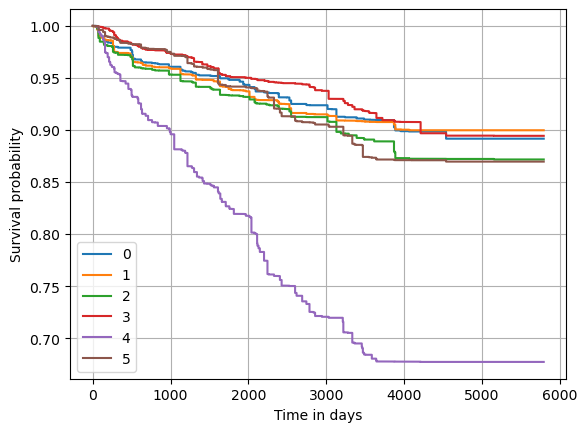

In [130]:
surv = rsf.predict_survival_function(X_test_sel, return_array=True)

for i, s in enumerate(surv):
    plt.step(rsf.unique_times_, s, where="post", label=str(i))
plt.ylabel("Survival probability")
plt.xlabel("Time in days")
plt.legend()
plt.grid(True)

In [131]:
from sklearn.inspection import permutation_importance

result = permutation_importance(rsf, X_test, y_test, n_repeats=15, random_state=random_state)

In [132]:
pd.DataFrame(
    {
        k: result[k]
        for k in (
            "importances_mean",
            "importances_std",
        )
    },
    index=X_test.columns,
).sort_values(by="importances_mean", ascending=False)

,importances_mean,importances_std
age_s1,0.107602,0.013931
prev_stk,0.079780,0.011337
left_peak_value-thr_0.5-sleepstages_2_3-smoothing_5,0.014957,0.003421
left_peak_std-thr_0.5-sleepstages_2_3-smoothing_5,0.010482,0.006611
prev_mi,0.004749,0.002564
left_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5,0.003061,0.003181
global_min_value-thr_0.5-sleepstages_2_3-smoothing_5,0.002305,0.003290
left_peak_index-thr_0.5-sleepstages_2_3-smoothing_5,0.001965,0.003078
right_peak_max_value-thr_0.5-sleepstages_2_3-smoothing_5,0.001766,0.001708
right_peak_std-thr_0.5-sleepstages_2_3-smoothing_5,0.001643,0.004074


### Predicted vs. actual survival

In [ ]:
# Predict survival functions for the training set
#surv_funcs = rsf.predict_survival_function(X_train)

# Predict survival functions for the test set
surv_funcs_test = rsf.predict_survival_function(X_test)

# Plot predicted survival functions
plt.figure(figsize=(12, 6))

#for i, surv_func in enumerate(surv_funcs_test):
#    plt.step(surv_func.x, surv_func.y, where="post", label=f"Predicted Survival Function {i+1}")

# Plot actual survival times
for i, (event, time) in enumerate(y_test):
    plt.axvline(time, color='r', linestyle='--', label=f'Actual Time {i+1} ({"Event" if event else "Censored"})')

plt.xlabel('Time')
plt.ylabel('Survival Probability')
plt.title('Predicted vs Actual Survival')
plt.show()